In [1]:
# Chargement des librairies nécessaires
library(ggplot2)
library(tidyverse)
library(gridExtra)
library(GGally)
library(plotly)
library(corrplot)
library(reshape2)
library(FactoMineR) 
library(factoextra)
library(glmnet) 
library(ggfortify)
library(pROC)
install.packages("maps")
library(maps)
install.packages("plotly")
library(plotly)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.0     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ lubridate 1.9.3     ✔ tibble    3.2.1
✔ purrr     1.0.1     ✔ tidyr     1.3.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attachement du package : ‘gridExtra’


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


Attachement du package : ‘plotly’


L'objet suivant est masqué depuis ‘package:ggplot2’:

    last_plot


L'objet suivant est masqué depuis ‘package:stats’:

    filter


L'objet suivant est masqué depuis ‘package:graphics’:

    layout


corrplot 0.92 loaded


Attachement du package : ‘reshape2’


L'objet sui

In [2]:
# Lecture des données
energy <- read.table("energy.txt", sep = ",", header = TRUE)
# Premières lignes du jeu de données
head(energy)
# Vérification du contenu
summary(energy)

,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,⋯,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,9.22,20000,44.99,0.16,0,0.31,⋯,302.5948,1.64,760,NA,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,8.86,130000,45.60,0.09,0,0.50,⋯,236.8919,1.74,730,NA,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,8.47,3950000,37.83,0.13,0,0.56,⋯,210.8622,1.40,1030,NA,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,8.09,25970000,36.66,0.31,0,0.63,⋯,229.9682,1.40,1220,NA,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,7.75,NA,44.24,0.33,0,0.56,⋯,204.2312,1.20,1030,NA,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,7.51,9830000,33.88,0.34,0,0.59,⋯,252.0691,1.41,1550,NA,11.229715,242.0313,60,652230,33.93911,67.70995


    Entity               Year      Access.to.electricity....of.population.
 Length:3649        Min.   :2000   Min.   :  1.252                        
 Class :character   1st Qu.:2005   1st Qu.: 59.801                        
 Mode  :character   Median :2010   Median : 98.362                        
                    Mean   :2010   Mean   : 78.934                        
                    3rd Qu.:2015   3rd Qu.:100.000                        
                    Max.   :2020   Max.   :100.000                        
                                   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

In [3]:
# Conversion de la variable Year en facteur
energy$Year <- as.factor(energy$Year)
# Conversion de la variable Density en variable numérique
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))
summary(energy)

    Entity               Year      Access.to.electricity....of.population.
 Length:3649        2013   : 175   Min.   :  1.252                        
 Class :character   2014   : 175   1st Qu.: 59.801                        
 Mode  :character   2015   : 175   Median : 98.362                        
                    2016   : 175   Mean   : 78.934                        
                    2017   : 175   3rd Qu.:100.000                        
                    2018   : 175   Max.   :100.000                        
                    (Other):2599   NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   :  0.00                   
 1st Qu.: 23.18                   
 Median : 83.15                   
 Mean   : 63.26                   
 3rd Qu.:100.00                   
 Max.   :100.00                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   

In [4]:
missing_data <- colMeans(is.na(energy)) * 100

# Trier les résultats par ordre décroissant
sorted_missing_data <- sort(missing_data, decreasing = TRUE)

# Afficher les résultats de manière propre
cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
# Suppression de la varible Renewable.electricity.generating.capacity.per.capita
energy <- subset(energy, select = -Renewable.electricity.generating.capacity.per.capita)
# Suppression de la variable Financial.flows.to.developing.countries..US...
energy <- subset(energy, select = -Financial.flows.to.developing.countries..US...)
# Suppression de la variable Renewables....equivalent.primary.energy.
energy <- subset(energy, select =  -Renewables....equivalent.primary.energy.)
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Renewables....equivalent.primary.energy. :  58.56 %
Financial.flows.to.developing.countries..US... :  57.25 %
Renewable.electricity.generating.capacity.per.capita :  25.51 %
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.fossil.fuels..TWh. :  0.58 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Entity :  0.00 %
Year :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %


,Entity,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude
,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,Afghanistan,2000,1.613591,6.2,44.99,0.16,0,0.31,65.95744,302.5948,1.64,760,NA,NA,60,652230,33.93911,67.70995
2,Afghanistan,2001,4.074574,7.2,45.60,0.09,0,0.50,84.74577,236.8919,1.74,730,NA,NA,60,652230,33.93911,67.70995
3,Afghanistan,2002,9.409158,8.2,37.83,0.13,0,0.56,81.15942,210.8622,1.40,1030,NA,179.4266,60,652230,33.93911,67.70995
4,Afghanistan,2003,14.738506,9.5,36.66,0.31,0,0.63,67.02128,229.9682,1.40,1220,8.832278,190.6838,60,652230,33.93911,67.70995
5,Afghanistan,2004,20.064968,10.9,44.24,0.33,0,0.56,62.92135,204.2312,1.20,1030,1.414118,211.3821,60,652230,33.93911,67.70995
6,Afghanistan,2005,25.390894,12.2,33.88,0.34,0,0.59,63.44086,252.0691,1.41,1550,11.229715,242.0313,60,652230,33.93911,67.70995


In [5]:
energy <- na.omit(energy)
dim(energy)

[1] 2868   18

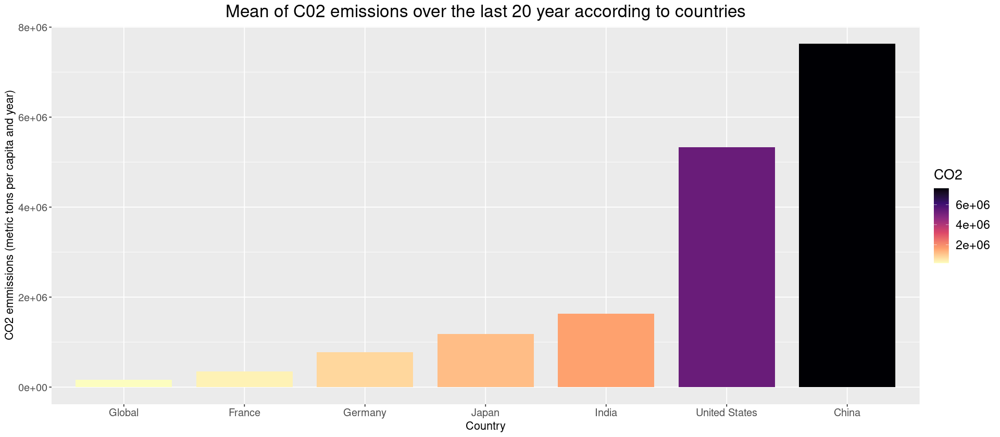

In [6]:
options(repr.plot.width = 16)
df <- energy$Value_co2_emissions_kt_by_country
df <-  matrix(df, nrow = 2868)
df <- as.data.frame(df)
colnames(df) = list("CO2")
df$Country <- energy$Entity
df_mean <- summarise(group_by(df, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
df <- data.frame(Country = Country, CO2 = CO2)
fr <- df[48,] ## France
df <- arrange(df, desc(CO2))
top_5 <- head(df, 5)
last_5 <- tail(df,5)
moyenne <- mean(df$CO2)
mean <- data.frame("Country" = "Global", "CO2" = moyenne)
df <- rbind(top_5, fr)
df <- rbind(df,mean)
#df <- rbind(df,last_5)
ggplot(df, aes(x=reorder(Country, CO2), y=CO2, fill=CO2)) +
  geom_bar(stat = "identity", position = "stack", width = 0.8) +
  labs(title = "Mean of C02 emissions over the last 20 year according to countries", x = "Country", y = "CO2 emmissions (metric tons per capita and year)") +
  theme(plot.title = element_text(size = 20, hjust = 0.5), 
        axis.text.y = element_text(size = 12),
        axis.title.y = element_text(size = 13),
        axis.text.x = element_text(size = 12),
       axis.title.x = element_text(size = 13),
       legend.text = element_text(size = 14),  # Ajuster la taille du texte de la légende
       legend.title = element_text(size = 16),  # Ajuster la taille du titre de la légende
       legend.position = "right") + 
       scale_fill_viridis_c(option = "A", direction = -1)

In [7]:
library(viridis)
options(repr.plot.width = 16)
dfa <- energy$Value_co2_emissions_kt_by_country
dfa <-  matrix(dfa, nrow = 2868)
dfa <- as.data.frame(dfa)
colnames(dfa) = list("CO2")
dfa$Country <- energy$Entity
df_mean <- summarise(group_by(dfa, Country), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Country <- df_mean$Country
dfa <- data.frame(Country = Country, CO2 = CO2)
plot_ly(data = dfa, type = "choropleth", locations = ~Country, locationmode = "country names", z = ~CO2, text = ~paste("Pays: ", Country, "<br>CO2 emissions (metric tons per year): ", CO2),colors = viridis(100, direction = -1, option ="A")) %>%
  colorbar(title = "CO2 émis",colors = viridis(100, direction = -1, option ="A")) %>%
  layout(title = "Mean of CO2 emissions over the last 20 years according to countries")

Le chargement a nécessité le package : viridisLite


Attachement du package : ‘viridis’


L'objet suivant est masqué depuis ‘package:maps’:

    unemp




HTML widgets cannot be represented in plain text (need html)

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidt

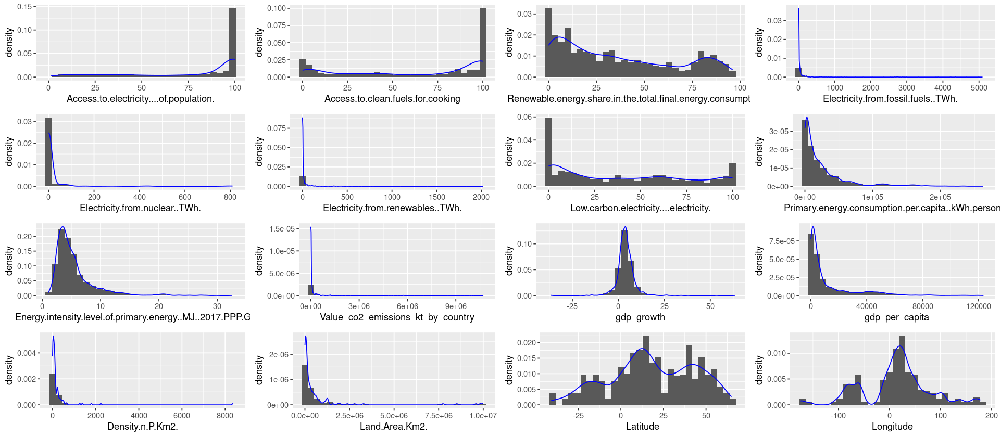

In [8]:
## que des variables quantitatives mis à part Entity et Year
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g4<-ggplot(energy,aes(x=Electricity.from.fossil.fuels..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

In [9]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
energy[, "Electricity.from.fossil.fuels..TWh."] <- sqrt(energy[, "Electricity.from.fossil.fuels..TWh."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- log(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."]) 

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.
`stat_bin()` using `bins = 30`. Pick better value with `binwid

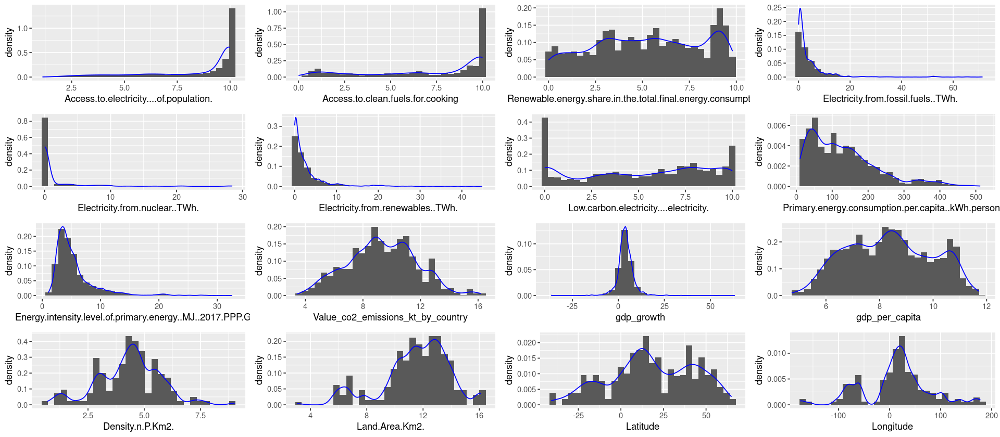

In [10]:
g1<-ggplot(energy,aes(x=Access.to.electricity....of.population.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g2<-ggplot(energy,aes(x=Access.to.clean.fuels.for.cooking))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g3<-ggplot(energy,aes(x=Renewable.energy.share.in.the.total.final.energy.consumption....))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g4<-ggplot(energy,aes(x=Electricity.from.fossil.fuels..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g5<-ggplot(energy,aes(x=Electricity.from.nuclear..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g6<-ggplot(energy,aes(x=Electricity.from.renewables..TWh.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g7<-ggplot(energy,aes(x=Low.carbon.electricity....electricity.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g8<-ggplot(energy,aes(x=Primary.energy.consumption.per.capita..kWh.person.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g9<-ggplot(energy,aes(x=Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g10<-ggplot(energy,aes(x=Value_co2_emissions_kt_by_country))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g11<-ggplot(energy,aes(x=gdp_growth))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g12<-ggplot(energy,aes(x=gdp_per_capita))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue")
g13<-ggplot(energy,aes(x=Density.n.P.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g14<-ggplot(energy,aes(x=Land.Area.Km2.))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g15<-ggplot(energy,aes(x=Latitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
g16<-ggplot(energy,aes(x=Longitude))+geom_histogram(aes(y=..density..))+geom_density(alpha=.2, col="blue") 
grid.arrange(g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16,ncol=4)
rm(g1,g2,g3,g4,g5,g6,g7,g8,g9,g10,g11,g12,g13,g14,g15,g16)

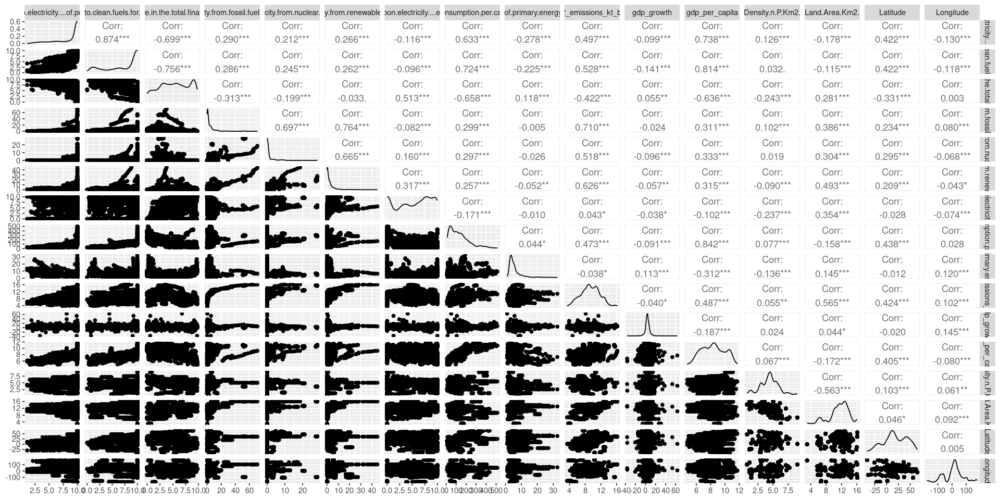

In [53]:
ggpairs(energy[, c(3:18)])

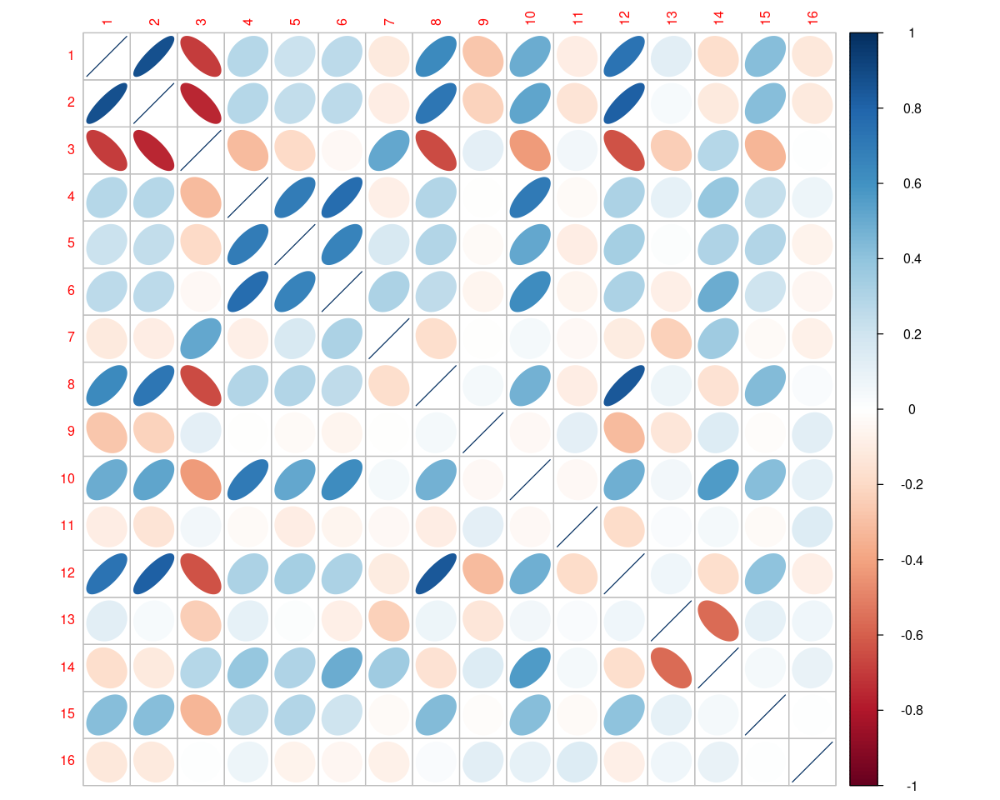

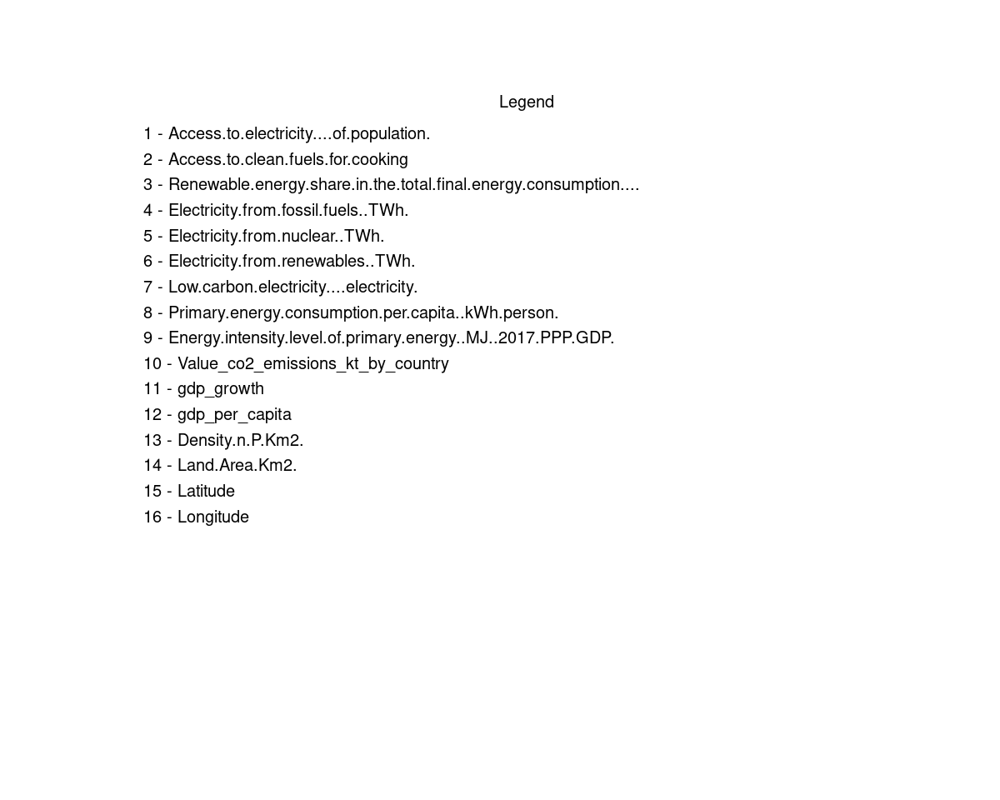

In [18]:
library(corrplot)
options(repr.plot.width = 10, repr.plot.height = 8)
energy2 <- energy
original_names <- colnames(energy2)[3:18]
# Renommer les colonnes
colnames(energy2)[3:18] <- 1:16

# Matrice de corrélation
cor_matrix <- cor(energy2[, c(3:18)])

# Afficher le corrplot avec une taille de police plus grande pour les noms de variables
corrplot(cor_matrix, method = "ellipse", tl.cex = 0.8)

# Légende pour montrer la correspondance entre les numéros et les noms originaux des variables
plot.new()
legend_names <- c(paste(1:16, " - ",original_names, sep = ""))
legend("topright", legend = legend_names, title = "Legend", cex = 1, bty = "n", col = "black")

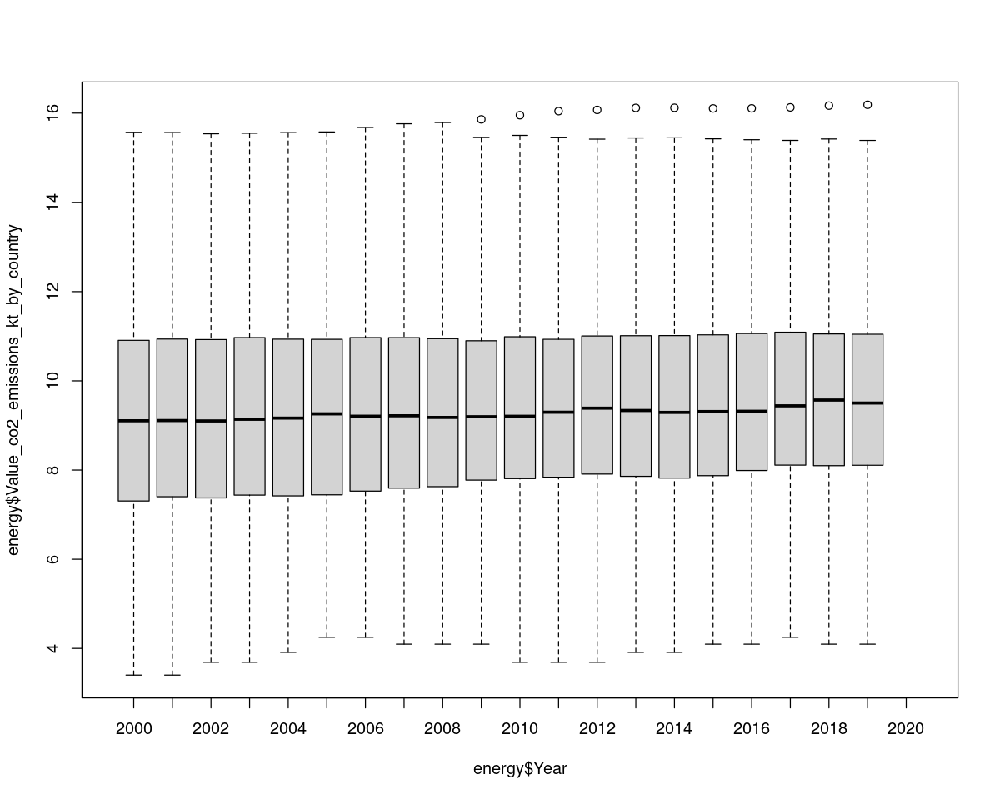

In [19]:
boxplot(energy$Value_co2_emissions_kt_by_country ~ energy$Year, data=energy)

In [11]:
library(forcats)
energy$Entity <- as.factor(energy$Entity)
#energy$Entity <- fct_collapse(energy$Entity, "PIB ++" = c("Australia","Canada","China","Denmark","Finland","France","Germany","Iceland","Ireland","India","Italy","Japan",
                                                      #    "Luxembourg","Netherlands","Norway","Qatar","Singapore","Spain","Sweden","Switzerland","United Arab Emirates",
                                                       #   "United Kingdom","United States","Cyprus"), "PIB +" = c("Algeria","Argentina","Austria","Belgium","Brazil","Cameroon","Colombia",
                           #   "Croatia","Ecuador","Estonia","Greece","Hungary","Israel","Malta","Mexico","Morocco","New Zealand","Nigeria","Oman","Peru","Philippines","Poland","Portugal",
                            #  "Romania","Serbia","Seychelles","Thailand","Slovenia","South Africa","Tunisia","Ukraine","Uruguay"), "PIB -" = c("Armenia","Angola","Antigua and Barbuda","Azerbaijan","Bahrain",
                                                                                                                                           #    "Barbados","Belarus","Belize","Benin","Bhutan","Bosnia and Herzegovina",
                                                                                                                                           #   "Botswana","Cambodia",
                                                                                                                                           #   "Costa Rica","Cuba","Dominica","Dominican Republic","El Salvador","Equatorial Guinea",
                                                                                                                                            #  "Eswatini","Fiji","Gabon","Georgia","Ghana","Grenada","Guatemala","Guinea",
                                                                                                                                            #  "Guinea-Bissau","Guyana","Honduras","Iraq","Jamaica","Jordan","Kenya","Kuwait","Latvia","Lithuania","Maldives","Mauritius","Mongolia","Montenegro",
                                                                                                                                            #  "Namibia","Nauru","Nicaragua","North Macedonia","Pakistan","Panama","Papua New Guinea","Paraguay","Samoa",
                                                                                                                                            #  "Sri Lanka","Suriname","Tajikistan","Tonga","Trinidad and Tobago","Turkmenistan","Uzbekistan","Zimbabwe"),
                            # "PIB --" = c("Afghanistan","Bangladesh","Burkina Faso","Burundi","Central African Republic","Comoros","Chad","Djibouti","Eritrea","Ethiopia","Haiti","Kiribati","Lesotho","Liberia","Madagascar","Malawi","Mali","Mauritania","Mozambique","Myanmar","Nepal","Niger","Rwanda","Sao Tome and Principe",
                                         # "Senegal","Sierra Leone","Solomon Islands","Somalia","South Sudan","Sudan","Togo","Uganda","Vanuatu","Zambia"))
df <- energy$Value_co2_emissions_kt_by_country
df <-  matrix(df, nrow = 2868)
df <- as.data.frame(df)
colnames(df) = list("CO2")
df$Entity <- energy$Entity
df_mean <- summarise(group_by(df, Entity), mean_value = mean(CO2))
CO2 <- df_mean$mean_value
Entity <- df_mean$Entity
df <- data.frame(Entity = Entity, CO2 = CO2)
fr <- df[48,] ## France
df <- arrange(df, desc(CO2))
intervals <- c(0, 8, 10, 12, 14, 16)
labels <- c("--", "-", "=", "+", "++")
df$u <- cut(df$CO2, breaks = intervals, labels = labels, include.lowest = TRUE)
# Créer un dataframe avec les correspondances entre les pays et les modalités
modalites <- data.frame(Entity = df$Entity, Country = df$u)
# Joindre les deux dataframes en fonction du nom du pays
energy <- merge(energy, modalites, by = "Entity", all.x = TRUE)
# Afficher les premières lignes du dataframe pour vérifier
energy <- subset(energy, select = -Entity)
head(energy)
energy$Year <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))             

,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,Primary.energy.consumption.per.capita..kWh.person.,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,2003,3.839076,3.082207,6.054750,0.5567764,0,0.7937254,8.186653,15.16470,1.40,7.106606,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,-
2,2004,4.479394,3.301515,6.651316,0.5744563,0,0.7483315,7.932298,14.29095,1.20,6.937314,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,-
3,2005,5.038938,3.492850,5.820653,0.5830952,0,0.7681146,7.964977,15.87668,1.41,7.346010,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,-
4,2006,5.542444,3.721559,5.647123,0.4472136,0,0.8000000,8.728716,17.44766,1.50,7.473069,5.357403,5.574940,4.094345,13.38815,33.93911,67.70995,-
5,2007,6.004249,3.911521,5.364699,0.4472136,0,0.8660254,8.885233,18.82232,1.53,7.478735,13.826320,5.885251,4.094345,13.38815,33.93911,67.70995,-
6,2008,6.511528,4.086563,4.601087,0.4358899,0,0.7348469,8.600733,24.65428,1.94,8.177516,3.924984,5.898975,4.094345,13.38815,33.93911,67.70995,-


In [12]:
energy$Country <- factor(energy$Country, levels = c("=","--","-","+","++"))

In [13]:
str(energy)

'data.frame':	2868 obs. of  18 variables:
 $ Year                                                            : Factor w/ 4 levels "2000-2004","2005-2009",..: 1 1 2 2 2 2 2 3 3 3 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 5.54 6 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.72 3.91 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.65 5.36 ...
 $ Electricity.from.fossil.fuels..TWh.                             : num  0.557 0.574 0.583 0.447 0.447 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.8 0.866 ...
 $ Low.carbon.electricity....electricity.                          : num  8.19 7.93 7.96 8.73 8.89 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  15.2 14.3 15.9 17.4 18.8

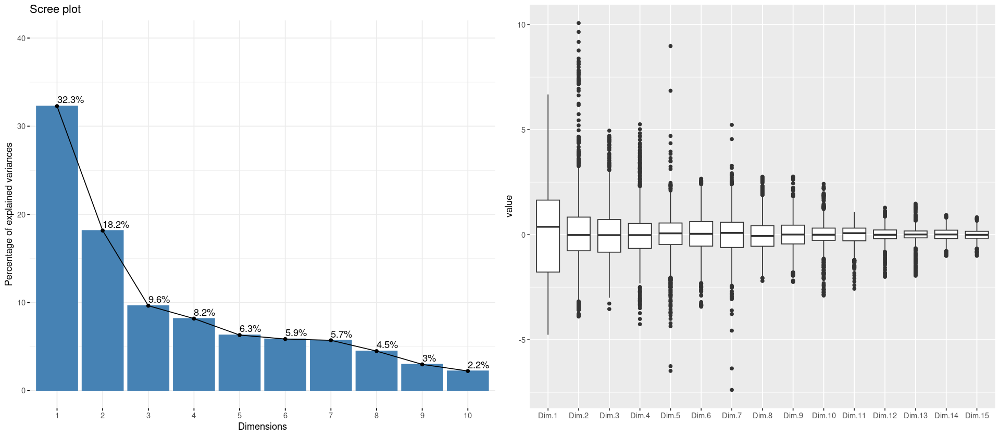

In [14]:
library(FactoMineR)
acp <- PCA(energy, scale.unit = TRUE,
           graph = FALSE, quali.sup = c(1,18), quanti.sup = 11, ncp = 15)
# Décroissance des valeurs propres
library(factoextra)
g1<-fviz_eig(acp, addlabels = TRUE, ylim = c(0, 40))
library(reshape2)
g2<-ggplot(melt(acp$ind$coord),aes(x=Var2,y=value))+
  geom_boxplot()+
  xlab("")
grid.arrange(g1,g2,ncol=2)

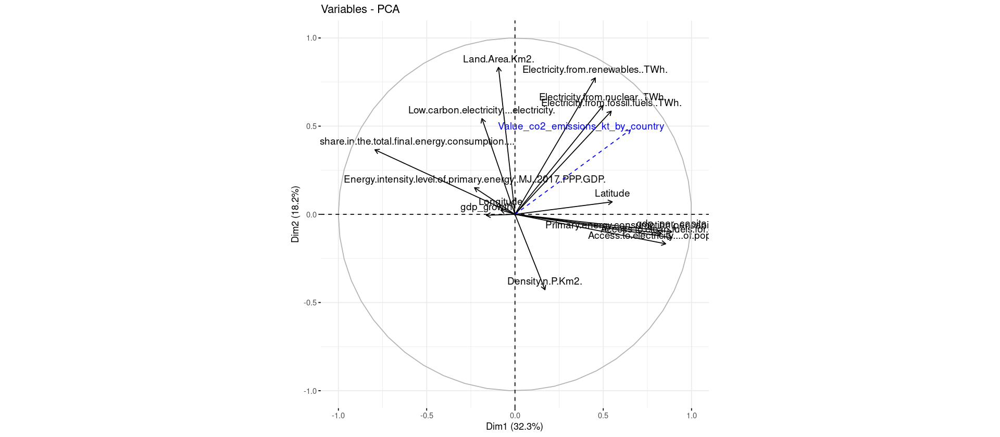

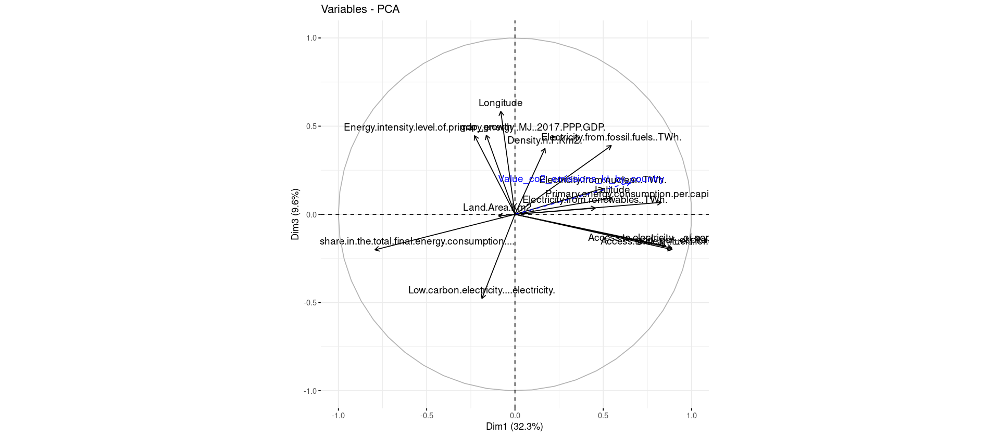

In [15]:
fviz_pca_var(acp)
fviz_pca_var(acp,axes=c(1,3))

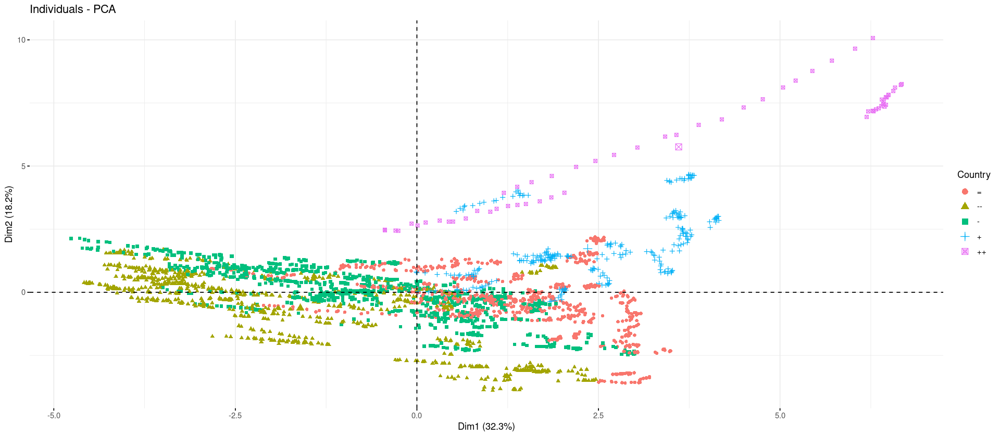

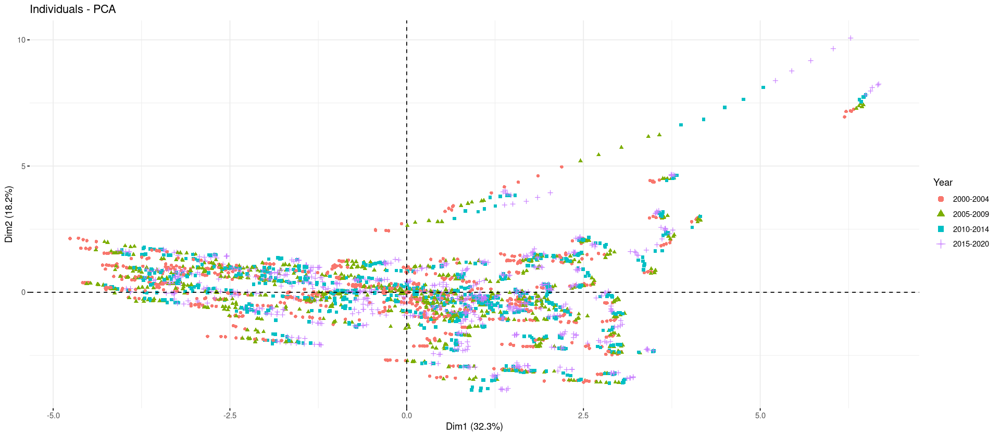

In [16]:
fviz_pca_ind(acp, label="none", habillage=18)
fviz_pca_ind(acp, label="none", habillage=1)

In [17]:
set.seed(111) # initialisation du générateur
# Extraction des échantillons
test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energy) # nombre de lignes dans les données
nvar <- ncol(energy) # nombre de colonnes
# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energy[appri, -c(5)] 
# construction de l'échantillon test
datestr <- energy[testi, -c(5)] 
# vérification
str(datappr)
str(datestr)

'data.frame':	2294 obs. of  17 variables:
 $ Year                                                            : Factor w/ 4 levels "2000-2004","2005-2009",..: 1 1 2 2 2 2 3 3 3 3 ...
 $ Access.to.electricity....of.population.                         : num  3.84 4.48 5.04 6 6.51 ...
 $ Access.to.clean.fuels.for.cooking                               : num  3.08 3.3 3.49 3.91 4.09 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.05 6.65 5.82 5.36 4.6 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.794 0.748 0.768 0.866 0.735 ...
 $ Low.carbon.electricity....electricity.                          : num  8.19 7.93 7.96 8.89 8.6 ...
 $ Primary.energy.consumption.per.capita..kWh.person.              : num  15.2 14.3 15.9 18.8 24.7 ...
 $ Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.     : num  1.4 1.2 1.41 1.53 1.94 2.25 2

In [18]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

In [64]:
### régression linéaire sans sélection de variable
reg.lm <- lm(Value_co2_emissions_kt_by_country ~ . , data = datappr)
summary(reg.lm)
anova(reg.lm,test="F")


Call:
lm(formula = Value_co2_emissions_kt_by_country ~ ., data = datappr)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.51061 -0.20492 -0.00518  0.21244  1.42273 

Coefficients:
                                                                   Estimate
(Intercept)                                                      -9.2218055
Year2005-2009                                                    -0.1364125
Year2010-2014                                                    -0.1764182
Year2015-2020                                                    -0.1036855
Access.to.electricity....of.population.                           0.1883467
Access.to.clean.fuels.for.cooking                                 0.0243393
Renewable.energy.share.in.the.total.final.energy.consumption.... -0.0999487
Electricity.from.nuclear..TWh.                                   -0.0138726
Electricity.from.renewables..TWh.                                -0.0137630
Low.carbon.electricity....electricity.        

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Year,3,35.528155,11.8427185,95.82166,2.134947e-58
Access.to.electricity....of.population.,1,3131.809907,3131.8099066,25340.06127,0.000000e+00
Access.to.clean.fuels.for.cooking,1,419.987325,419.9873251,3398.19621,0.000000e+00
Renewable.energy.share.in.the.total.final.energy.consumption....,1,7.882189,7.8821890,63.77627,2.192739e-15
Electricity.from.nuclear..TWh.,1,2123.736473,2123.7364732,17183.55007,0.000000e+00
Electricity.from.renewables..TWh.,1,1594.112366,1594.1123664,12898.26210,0.000000e+00
Low.carbon.electricity....electricity.,1,1.485252,1.4852519,12.01745,5.368391e-04
Primary.energy.consumption.per.capita..kWh.person.,1,15.067320,15.0673204,121.91251,1.201124e-27
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,1,50.988075,50.9880754,412.55408,2.043747e-84


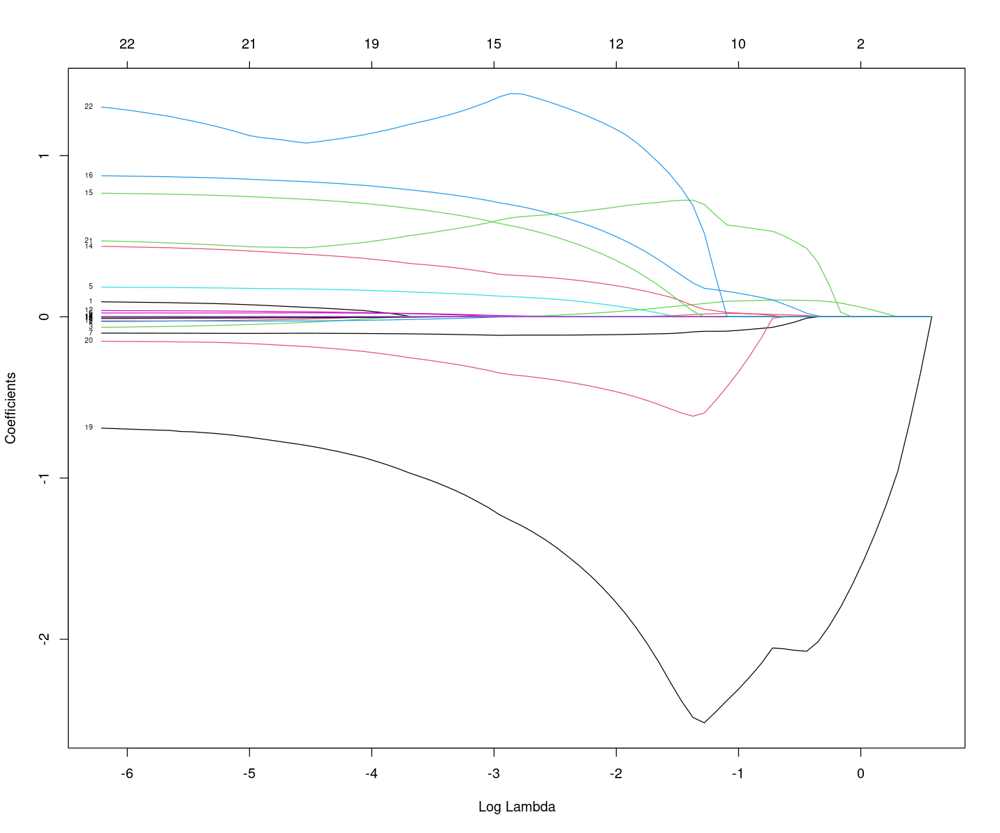

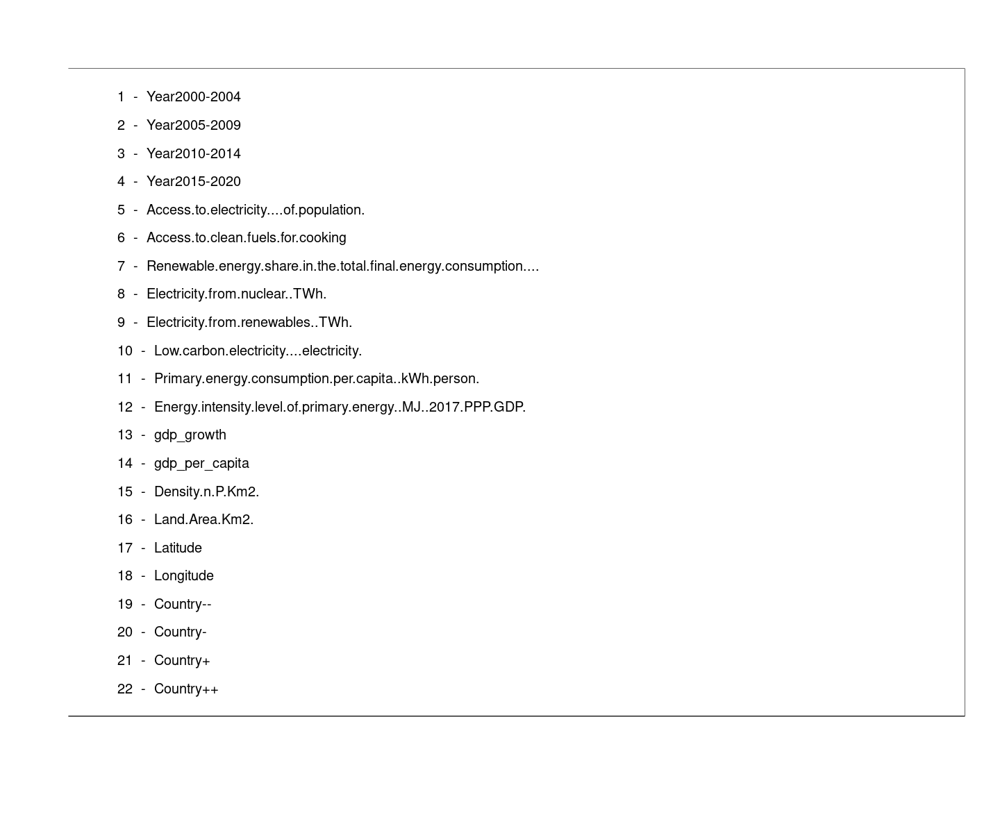

In [79]:
### Lasso
library(glmnet)
x.mat <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1, data = datappr)
reg.lasso <- glmnet(y = datappr$Value_co2_emissions_kt_by_country, x = x.mat)
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE)

plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

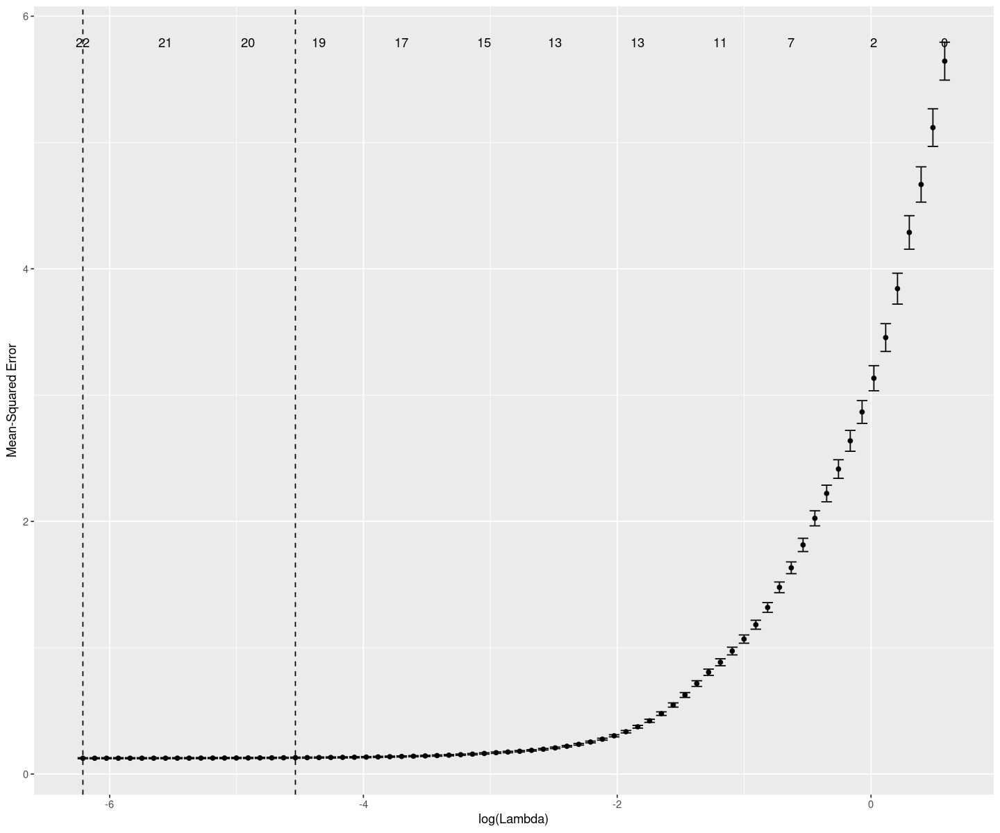

In [80]:
reg.lasso.cv <- cv.glmnet(y = datappr[, 10], x = x.mat)
autoplot(reg.lasso.cv)

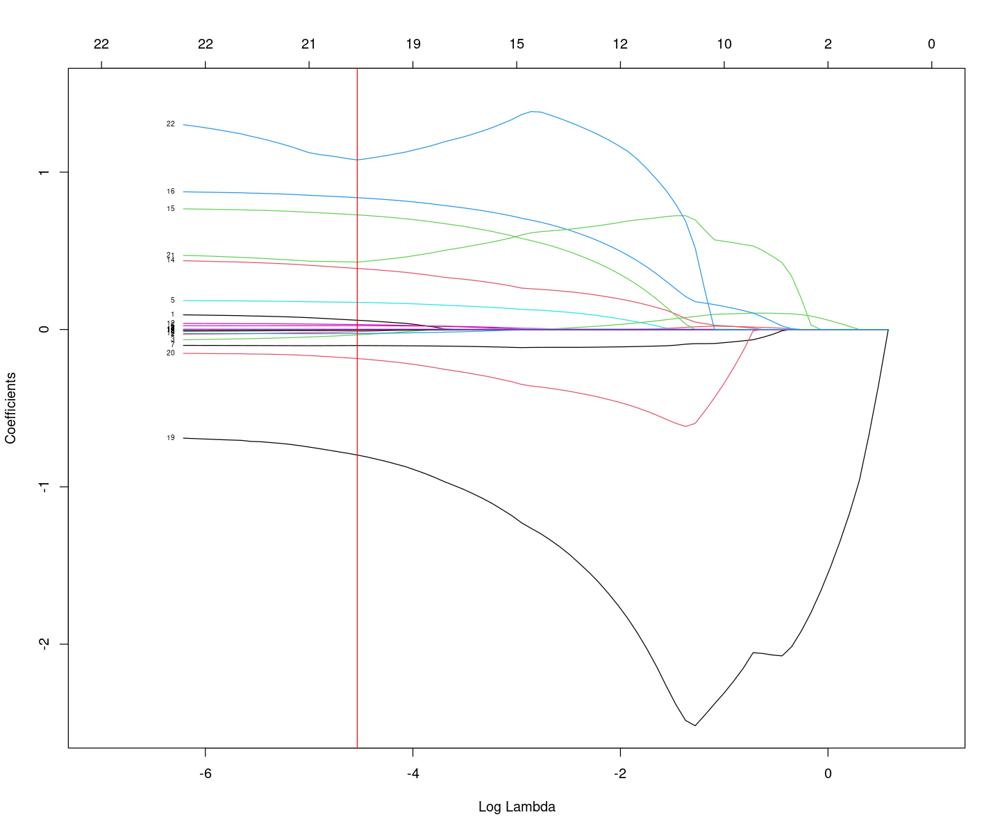

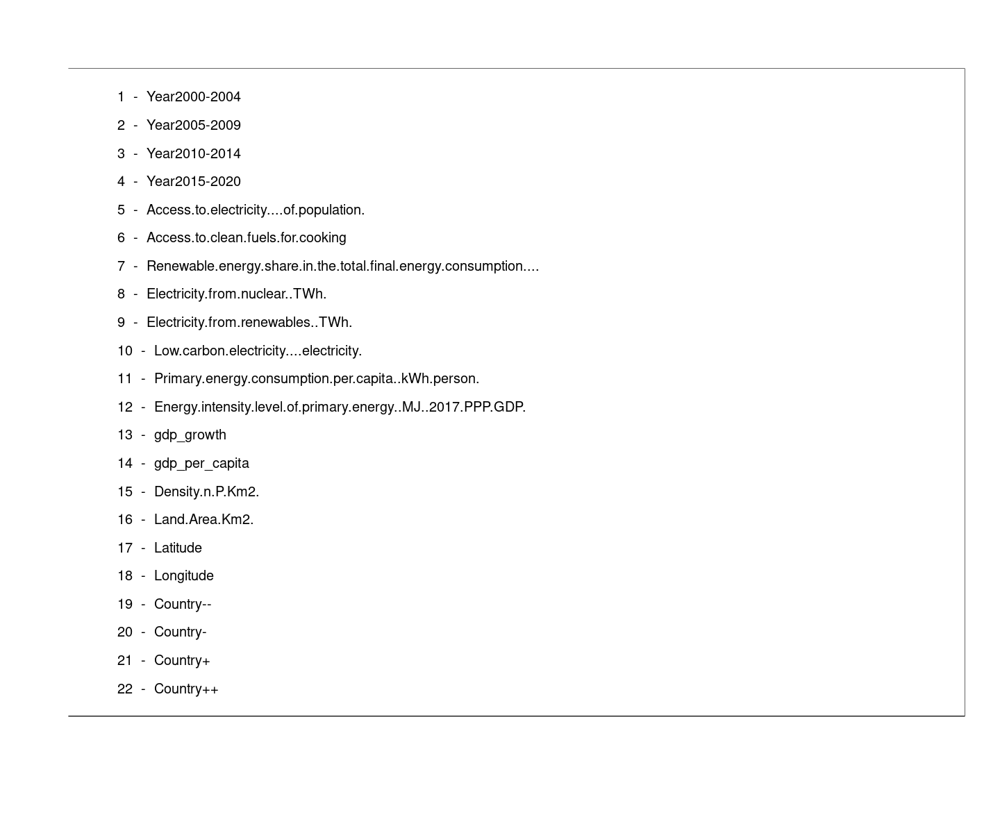

In [87]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-7,1),ylim=c(-2.5,1.5))
abline(v=log(reg.lasso.cv$lambda.1se),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

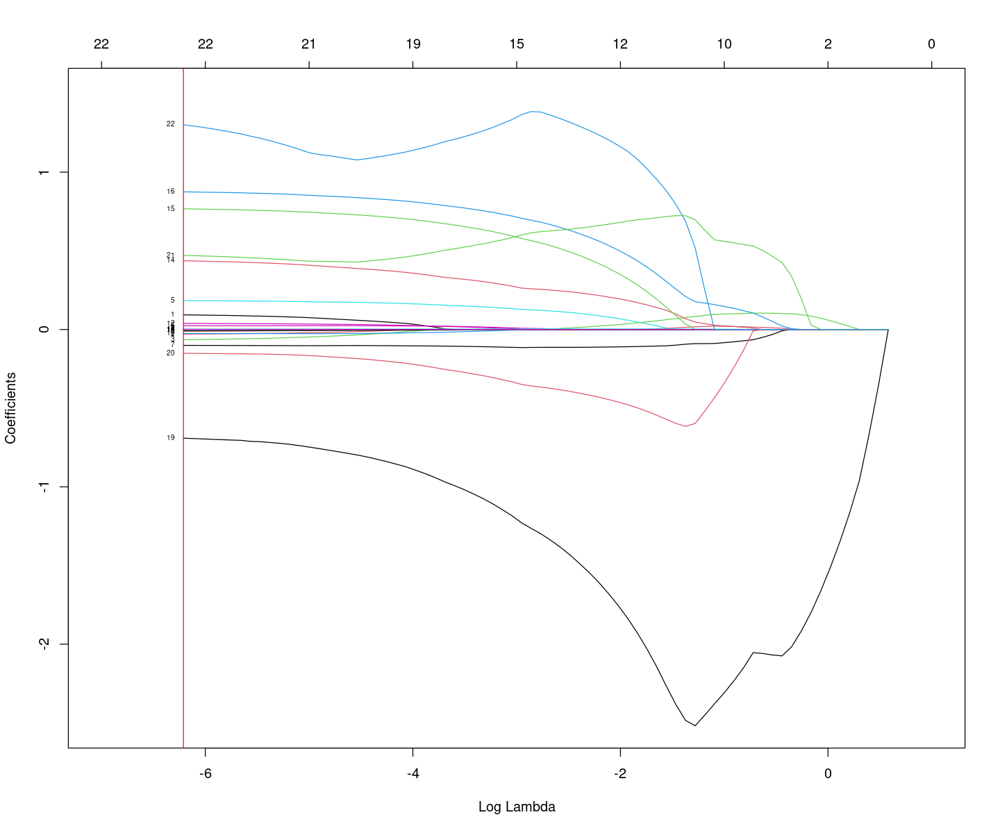

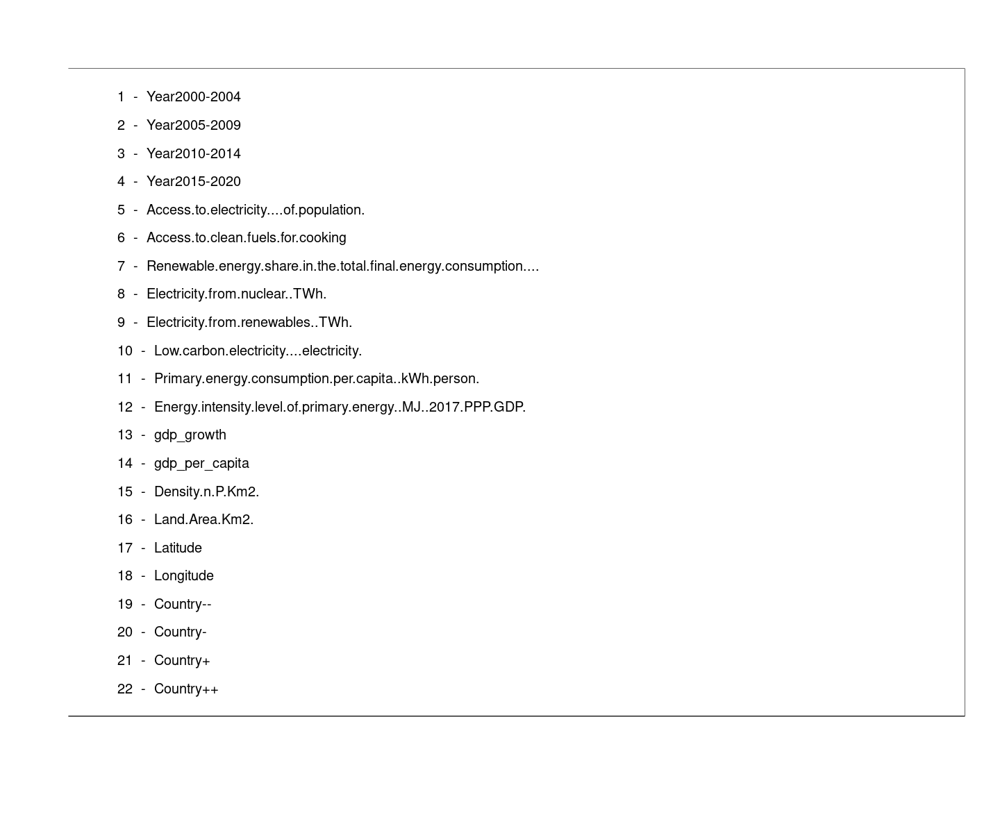

In [89]:
options(repr.plot.width = 12, repr.plot.height = 10)
plot(reg.lasso, xvar = "lambda", label = TRUE,xlim=c(-7,1),ylim=c(-2.5,1.5))
abline(v=log(reg.lasso.cv$lambda.min),col="red")
plot.new()
legend("topright", legend = paste(1:ncol(x.mat), " - ", colnames(x.mat)))

In [90]:
V=10 ; nV=floor(nrow(datappr)/V)
S=sample(1:nrow(datappr),replace=FALSE)
error.CV = c()
for(v in 1:V)
{ 
    datappr.learn=datappr[-c(S[(nV*(v-1)):(nV*v)]),] 
    datappr.valid=datappr[c(S[(nV*(v-1)):(nV*v)]),]
    error.CV=c(error.CV,mean((datappr.valid$Value_co2_emissions_kt_by_country-predict(aov(Value_co2_emissions_kt_by_country ~ ., data=datappr.learn),newdata=datappr.valid))^2))
}
mean(error.CV)

print(reg.lasso.cv)

[1] 0.1249157


Call:  cv.glmnet(x = x.mat, y = datappr[, 10]) 

Measure: Mean-Squared Error 

      Lambda Index Measure       SE Nonzero
min 0.002008    74  0.1253 0.004558      22
1se 0.010716    56  0.1295 0.004516      19


In [91]:
### critère AIC linéaire
reg.glm.step <- step(reg.lm, direction = "backward")
summary(reg.glm.step)
anova(reg.glm.step)

Start:  AIC=-4774.35
Value_co2_emissions_kt_by_country ~ Year + Access.to.electricity....of.population. + 
    Access.to.clean.fuels.for.cooking + Renewable.energy.share.in.the.total.final.energy.consumption.... + 
    Electricity.from.nuclear..TWh. + Electricity.from.renewables..TWh. + 
    Low.carbon.electricity....electricity. + Primary.energy.consumption.per.capita..kWh.person. + 
    Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. + 
    gdp_growth + gdp_per_capita + Density.n.P.Km2. + Land.Area.Km2. + 
    Latitude + Longitude + Country

                                                                   Df Sum of Sq
<none>                                                                         
- Access.to.clean.fuels.for.cooking                                 1      1.72
- Electricity.from.renewables..TWh.                                 1      1.88
- Primary.energy.consumption.per.capita..kWh.person.                1      2.10
- Electricity.from.nuclear..TWh.      


Call:
lm(formula = Value_co2_emissions_kt_by_country ~ Year + Access.to.electricity....of.population. + 
    Access.to.clean.fuels.for.cooking + Renewable.energy.share.in.the.total.final.energy.consumption.... + 
    Electricity.from.nuclear..TWh. + Electricity.from.renewables..TWh. + 
    Low.carbon.electricity....electricity. + Primary.energy.consumption.per.capita..kWh.person. + 
    Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. + 
    gdp_growth + gdp_per_capita + Density.n.P.Km2. + Land.Area.Km2. + 
    Latitude + Longitude + Country, data = datappr)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.51061 -0.20492 -0.00518  0.21244  1.42273 

Coefficients:
                                                                   Estimate
(Intercept)                                                      -9.2218055
Year2005-2009                                                    -0.1364125
Year2010-2014                                                    -0.1764182


,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
Year,3,35.528155,11.8427185,95.82166,2.134947e-58
Access.to.electricity....of.population.,1,3131.809907,3131.8099066,25340.06127,0.000000e+00
Access.to.clean.fuels.for.cooking,1,419.987325,419.9873251,3398.19621,0.000000e+00
Renewable.energy.share.in.the.total.final.energy.consumption....,1,7.882189,7.8821890,63.77627,2.192739e-15
Electricity.from.nuclear..TWh.,1,2123.736473,2123.7364732,17183.55007,0.000000e+00
Electricity.from.renewables..TWh.,1,1594.112366,1594.1123664,12898.26210,0.000000e+00
Low.carbon.electricity....electricity.,1,1.485252,1.4852519,12.01745,5.368391e-04
Primary.energy.consumption.per.capita..kWh.person.,1,15.067320,15.0673204,121.91251,1.201124e-27
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,1,50.988075,50.9880754,412.55408,2.043747e-84


Warning message:
“Removed 16 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”


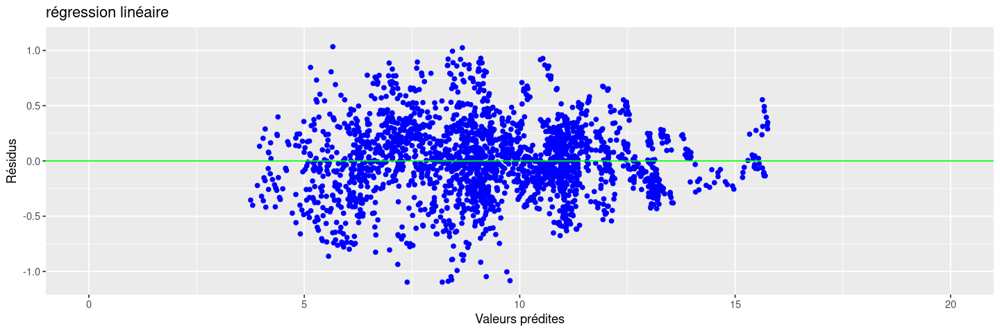

Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”


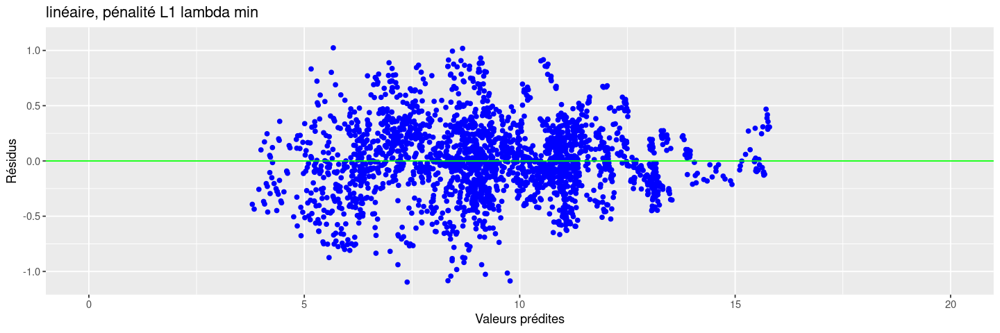

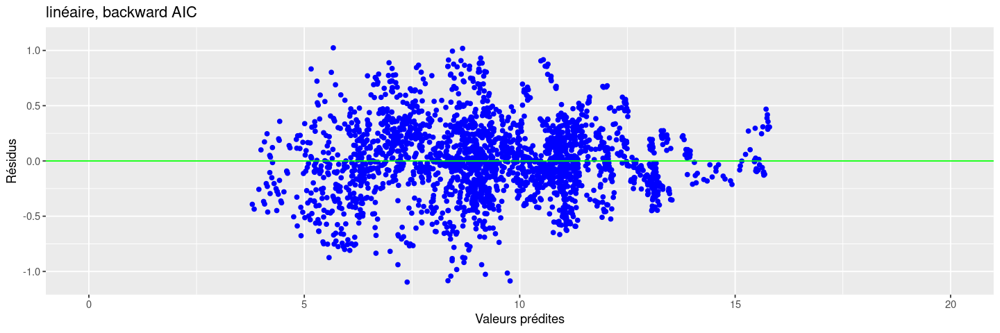

In [92]:
### linéaire pas de sélection
res.lm <- reg.lm$residuals
fit.lm <- reg.lm$fitted.values
### Lasso lambda min
fit.lasso <- predict(reg.lasso.cv, s = "lambda.min", newx = x.mat)
res.lasso <- datappr$Value_co2_emissions_kt_by_country - fit.lasso
### AIC
fit.glm <- reg.glm.step$fitted.values
res.glm <- reg.glm.step$residuals

# Graphe des résidus
options(repr.plot.width = 12, repr.plot.height = 4)
g1<-gplot.res(fit.lm, res.lm, "régression linéaire")
g2<-gplot.res(fit.lasso, res.lasso, "linéaire, pénalité L1 lambda min")
g3<-gplot.res(fit.lasso, res.lasso, "linéaire, backward AIC")
g1
g2
g3

In [93]:
# Calcul des prévisions pour le modèle linéaire complet
pred.glm <- predict(reg.lm, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1294018

In [94]:
# Calcul des prévisions pour le modèle linéaire pénalisation Lasso
x.test <- model.matrix(Value_co2_emissions_kt_by_country ~ . - 1, data = datestr)
reg.lasso.cv.test <- cv.glmnet(y = datestr[, 10], x = x.test)
fit.lasso <- predict(reg.lasso.cv.test, s = "lambda.min", newx = x.test)
# Erreur quadratique moyenne de prévision (MSE)
sum((fit.lasso - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1251252

In [95]:
# Calcul des prévisions pour le modèle linéaire backward AIC
pred.glm <- predict(reg.glm.step, newdata = datestr)
# Erreur quadratique moyenne de prévision (MSE)
sum((pred.glm - datestr[, "Value_co2_emissions_kt_by_country"])^2) / nrow(datestr)

[1] 0.1294018

In [96]:
### Conclusion de partie 1 : le meilleur modèle est le Lasso

In [24]:
paste("CV estimate of lambda :", round(reg.lasso.cv$lambda.min, 3))
coef(reg.lasso.cv, s = "lambda.min")

[1] "CV estimate of lambda : 0.002"

23 x 1 sparse Matrix of class "dgCMatrix"
                                                                            s1
(Intercept)                                                      -1.214827e+01
Year2000-2004                                                     6.553939e-03
Year2005-2009                                                    -2.970976e-02
Year2010-2014                                                    -1.254505e-02
Year2015-2020                                                     5.247590e-02
Access.to.electricity....of.population.                           1.181161e-01
Access.to.clean.fuels.for.cooking                                 .           
Renewable.energy.share.in.the.total.final.energy.consumption.... -6.762879e-02
Electricity.from.nuclear..TWh.                                   -7.807579e-03
Electricity.from.renewables..TWh.                                -1.815561e-02
Low.carbon.electricity....electricity.                           -3.384203e-02
Primary.en

In [19]:
library(e1071)

In [21]:
svm.reg.lin.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "lin", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5))
summary(svm.reg.lin.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 cost
  1.5

- best performance: 0.1555182 

- Detailed performance results:
  cost     error dispersion
1  1.0 0.1555610 0.02268911
2  1.5 0.1555182 0.02270094
3  2.0 0.1555722 0.02269788
4  2.5 0.1555502 0.02268729
5  3.0 0.1555415 0.02268760
6  3.5 0.1555366 0.02267248
7  4.0 0.1555702 0.02267929
8  4.5 0.1555512 0.02266423
9  5.0 0.1555651 0.02270478


Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


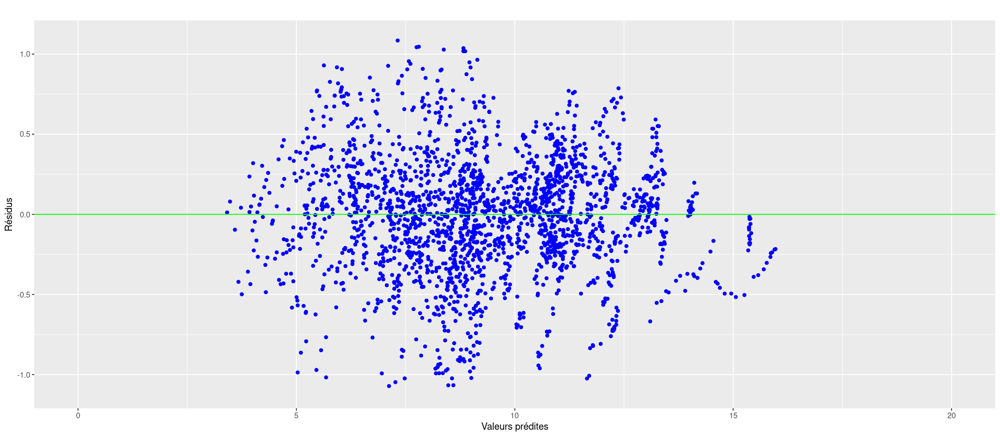

In [22]:
fit.svmr=svm.reg.lin.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [23]:
svm.reg.poly <- svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "poly")
summary(svm.reg.poly)


Call:
svm(formula = Value_co2_emissions_kt_by_country ~ . - Country - Year, 
    data = datappr, type = "eps-regression", kernel = "poly")


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  polynomial 
       cost:  1 
     degree:  3 
      gamma:  0.07142857 
     coef.0:  0 
    epsilon:  0.1 


Number of Support Vectors:  1040






Warning message:
“Removed 52 rows containing missing values (`geom_point()`).”


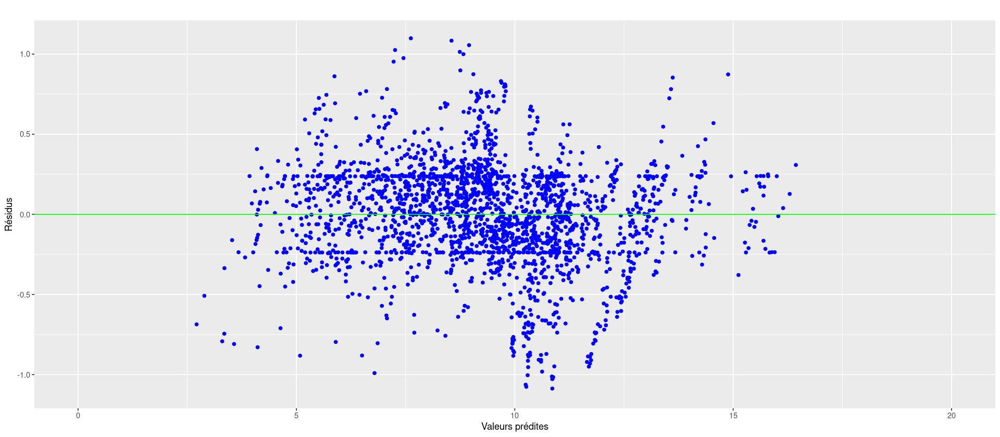

In [24]:
fit.svmr=svm.reg.poly$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [25]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5), coef0 = -5:5, gamma = seq(0.02, 0.1, by = 0.02), degree = 1:4)
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 degree gamma coef0 cost
      3  0.06     5  1.5

- best performance: 0.03301648 

- Detailed performance results:
     degree gamma coef0 cost        error   dispersion
1         1  0.02    -5  1.0 1.578607e-01 2.351624e-02
2         2  0.02    -5  1.0 1.461119e+07 1.062041e+06
3         3  0.02    -5  1.0 8.436027e+04 1.859508e+04
4         4  0.02    -5  1.0 3.611895e+10 2.622720e+09
5         1  0.04    -5  1.0 1.563163e-01 2.285931e-02
6         2  0.04    -5  1.0 5.799240e+07 4.202106e+06
7         3  0.04    -5  1.0 1.381389e+06 2.981100e+05
8         4  0.04    -5  1.0 1.430757e+11 1.036671e+10
9         1  0.06    -5  1.0 1.561432e-01 2.268033e-02
10        2  0.06    -5  1.0 1.294855e+08 9.401788e+06
11        3  0.06    -5  1.0 7.413498e+06 1.398283e+06
12        4  0.06    -5  1.0 3.212576e+11 2.306000e+10
13        1  0.08    -5  1.0 1.560302e-01 2.267176e-02
14        2  0.08   

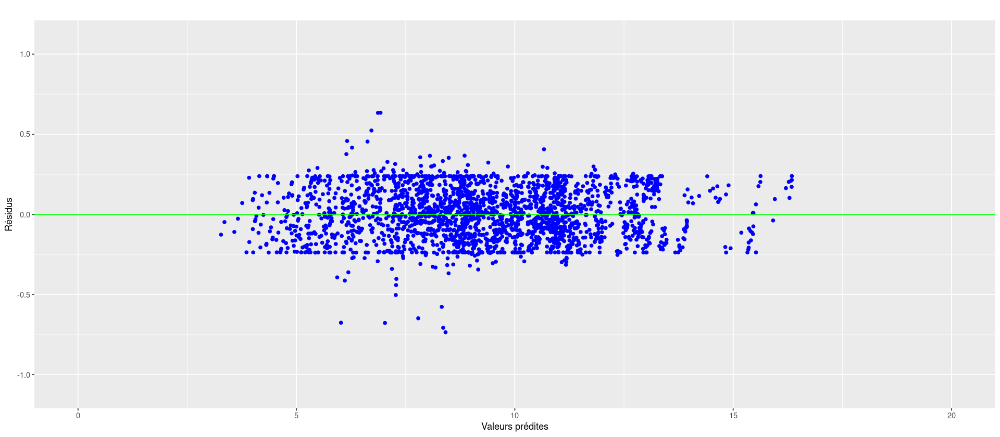

In [26]:
fit.svmr=svm.reg.poly.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [27]:
svm.reg.rad <- svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "radial")
summary(svm.reg.rad)


Call:
svm(formula = Value_co2_emissions_kt_by_country ~ . - Country - Year, 
    data = datappr, type = "eps-regression", kernel = "radial")


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.07142857 
    epsilon:  0.1 


Number of Support Vectors:  459






Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


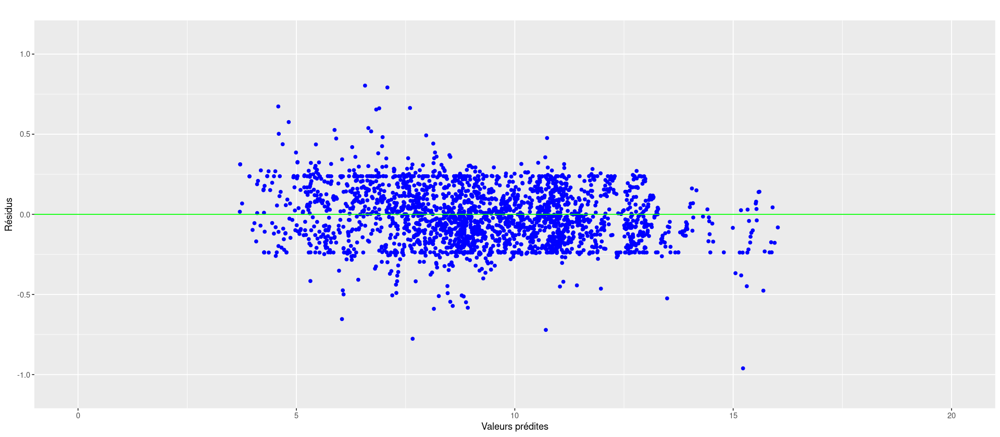

In [28]:
fit.svmr=svm.reg.rad$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [34]:
svm.reg.rad.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "radial", cost = c(1, 5, 10, 20, 100), gamma = seq(0.02, 0.1, by = 0.02))
summary(svm.reg.rad.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma cost
  0.02  100

- best performance: 0.03425156 

- Detailed performance results:
   gamma cost      error  dispersion
1   0.02    1 0.07245589 0.012064791
2   0.04    1 0.06462480 0.017783842
3   0.06    1 0.06179194 0.020526981
4   0.08    1 0.06202331 0.021865565
5   0.10    1 0.06695124 0.022861169
6   0.02    5 0.04699642 0.008501067
7   0.04    5 0.04463811 0.017058028
8   0.06    5 0.04692718 0.022042770
9   0.08    5 0.05075529 0.023053092
10  0.10    5 0.05545047 0.024330838
11  0.02   10 0.04109162 0.008656753
12  0.04   10 0.04263057 0.017286539
13  0.06   10 0.04647141 0.021807151
14  0.08   10 0.05058380 0.022916840
15  0.10   10 0.05517446 0.024294448
16  0.02   20 0.03783358 0.008848242
17  0.04   20 0.04161449 0.016953860
18  0.06   20 0.04623848 0.021720992
19  0.08   20 0.05034788 0.023239278
20  0.10   20 0.05500161 0.024197357
21  0.02  100 0.03425156 0.007377152
22

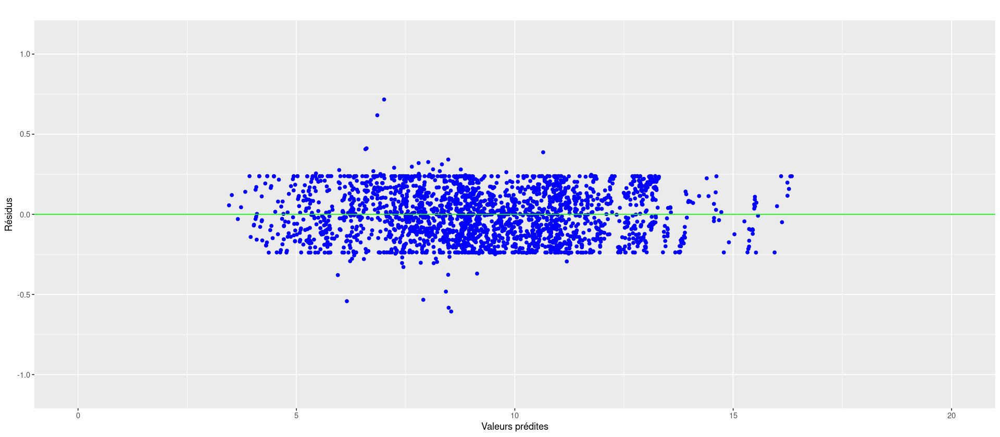

In [35]:
fit.svmr=svm.reg.rad.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [36]:
pred.svmr.lin.tune=predict(svm.reg.lin.tune$best.model,newdata=datestr)
pred.svmr.poly = predict(svm.reg.poly, newdata=datestr)
pred.svmr.poly.tune = predict(svm.reg.poly.tune$best.model, newdata = datestr)
pred.svmr.rad = predict(svm.reg.rad, newdata=datestr)
pred.svmr.rad.tune = predict(svm.reg.rad.tune$best.model, newdata = datestr)

paste("Tuned linear kernel:",sum((pred.svmr.lin.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Default polynomial kernel:",sum((pred.svmr.poly-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Tuned polynomial kernel:",sum((pred.svmr.poly.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Default radial kernel:",sum((pred.svmr.rad-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")
paste("Tuned radial kernel:",sum((pred.svmr.rad.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")

[1] "Tuned linear kernel: 0.16044659628599"

[1] "Default polynomial kernel: 0.215802249390441"

[1] "Tuned polynomial kernel: 0.0346346071750091"

[1] "Default radial kernel: 0.0650436133015688"

[1] "Tuned radial kernel: 0.0349294697223709"

In [28]:
### conclusion partie 2 : Tuned polynomial  et radial sont les meilleurs avec une erreur de généralisation de 0.034
### meilleur aussi que Lasso avec lambda min (pour rappel : 0.12)

In [37]:
library(rpart) 

In [40]:
tree.reg=rpart(Value_co2_emissions_kt_by_country~.,data=datappr,control=rpart.control(cp=0.001))

Warning message:
“labs do not fit even at cex 0.15, there may be some overplotting”


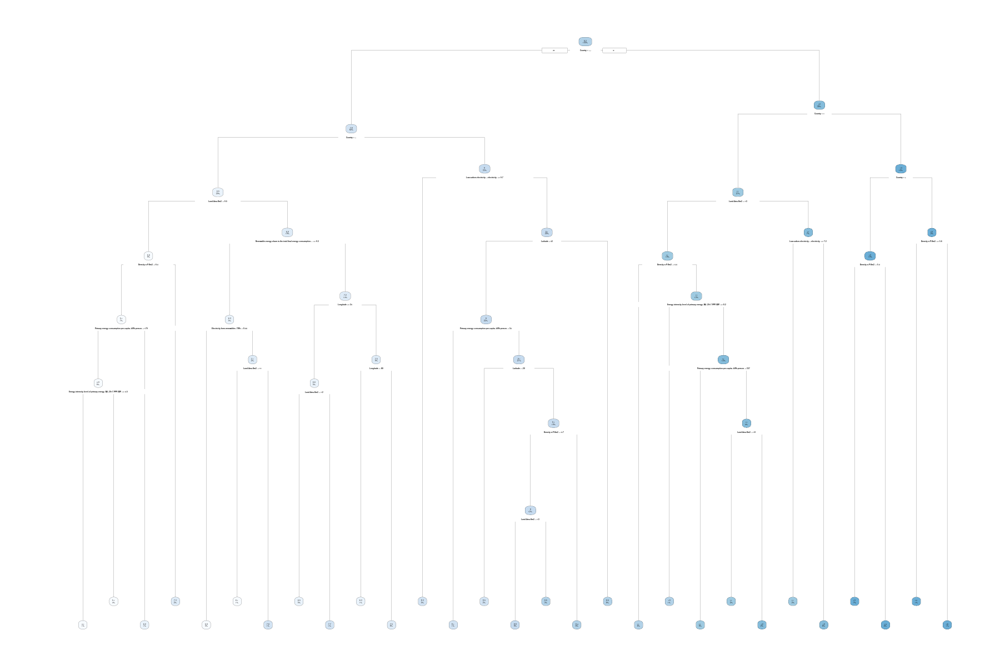

In [41]:
library(rpart.plot)
options(repr.plot.width = 15, repr.plot.height = 10)
rpart.plot(tree.reg)

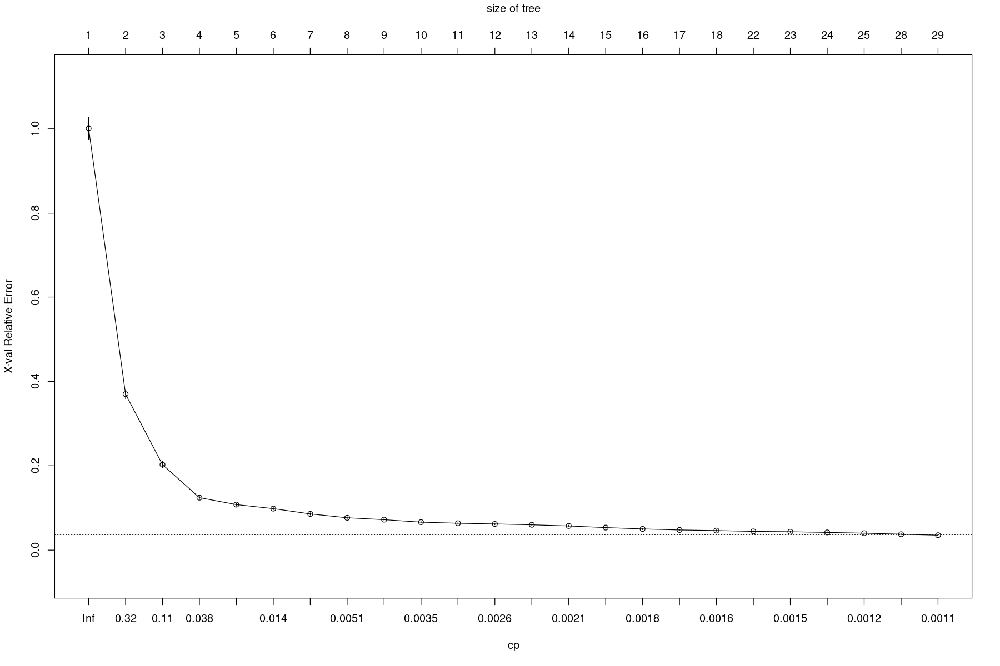

In [42]:
xmat<-xpred.rpart(tree.reg,xval=10) 
# one row for each observation and one column for each complexity value

# Cross-validation error par valeur de CP
CVerr<-apply((xmat-datappr[,"Value_co2_emissions_kt_by_country"])^2,2,sum)

plotcp(tree.reg)

[1] 0.001051734

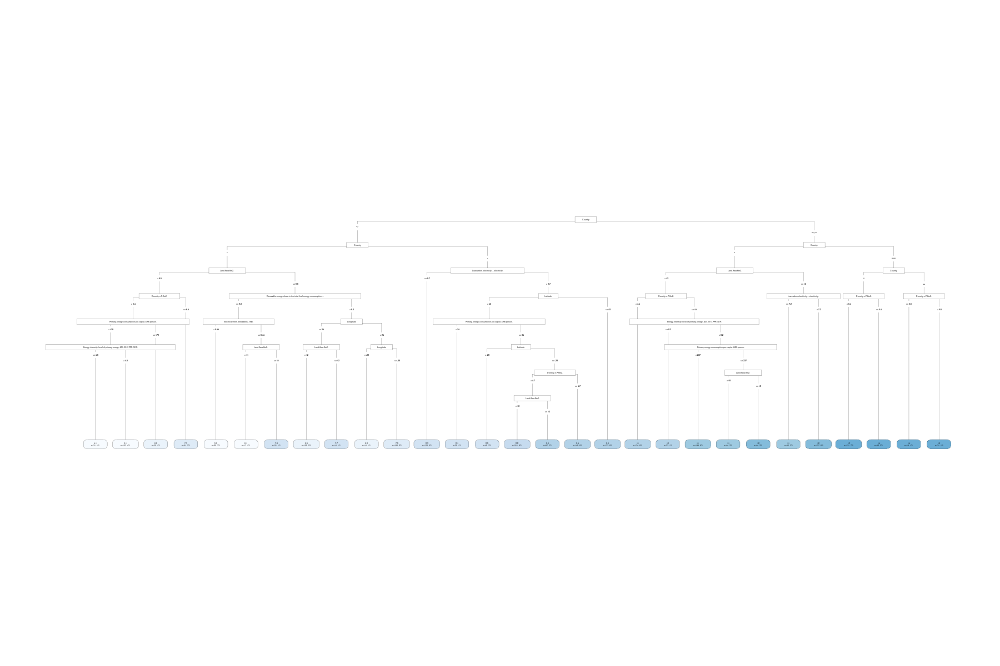

In [43]:
as.numeric(attributes(which.min(CVerr))$names)
tree.reg=rpart(Value_co2_emissions_kt_by_country~.,data=datappr,control=rpart.control(cp=as.numeric(attributes(which.min(CVerr))$names)))
rpart.plot(tree.reg,type=5,extra=101)

Le chargement a nécessité le package : grid

Le chargement a nécessité le package : libcoin

Le chargement a nécessité le package : mvtnorm



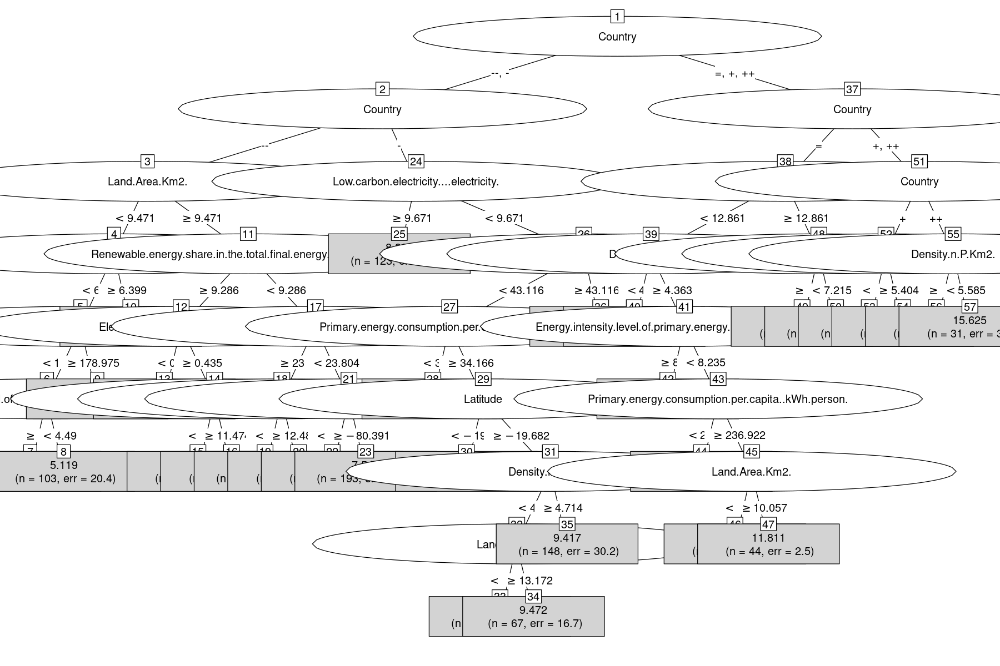

In [44]:
library(partykit)
plot(as.party(tree.reg), type="simple")

Warning message:
“Removed 20 rows containing missing values (`geom_point()`).”


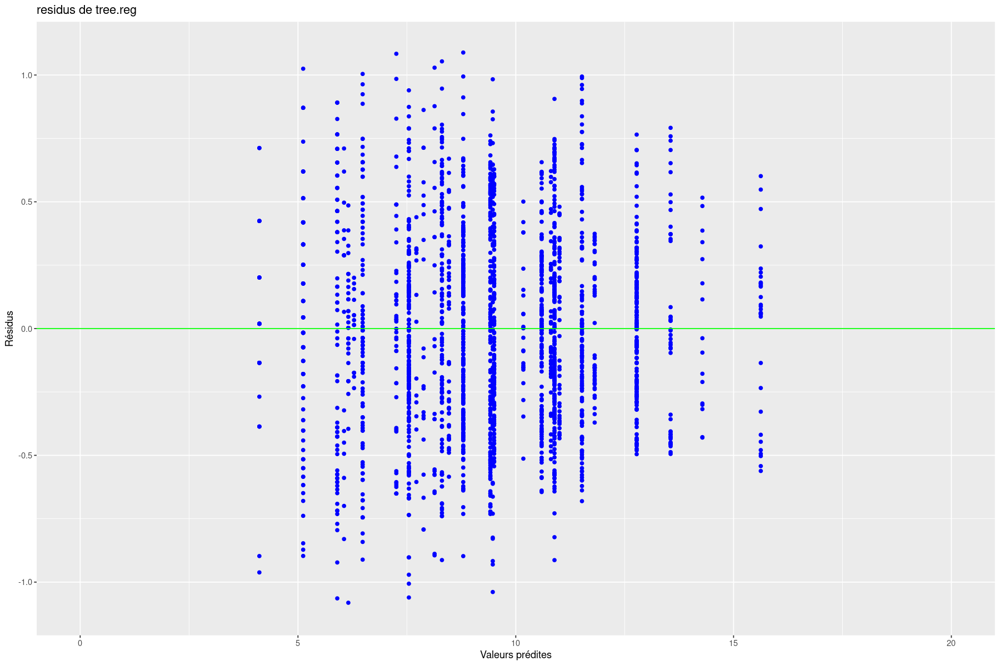

In [45]:
fit.tree=predict(tree.reg)
res.tree=fit.tree-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.tree,res.tree,"residus de tree.reg")

In [46]:
# Calcul des prévisions
pred.treer=predict(tree.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision en régression
sum((pred.treer-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.1802351

In [47]:
library(randomForest)

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attachement du package : ‘randomForest’


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


L'objet suivant est masqué depuis ‘package:ggplot2’:

    margin




In [48]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~., data=datappr,xtest=datestr[,-10],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |   0.0165     0.29 |  0.01516     0.26 |
 100 |  0.01473     0.26 |  0.01454     0.25 |
 150 |  0.01413     0.25 |  0.01438     0.25 |
 200 |  0.01407     0.25 |  0.01428     0.25 |
 250 |  0.01404     0.25 |  0.01444     0.25 |
 300 |  0.01388     0.25 |  0.01443     0.25 |
 350 |  0.01373     0.24 |  0.01427     0.25 |
 400 |  0.01365     0.24 |  0.01417     0.24 |
 450 |  0.01366     0.24 |  0.01429     0.25 |
 500 |  0.01362     0.24 |  0.01435     0.25 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 5

Warning message:
“Removed 1 rows containing missing values (`geom_point()`).”


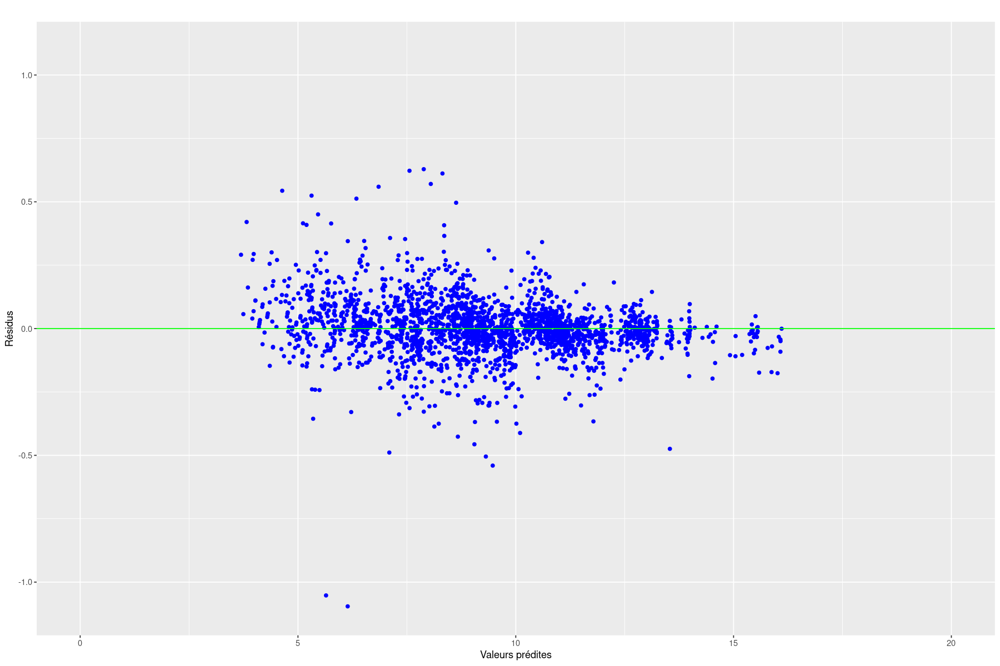

In [49]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

Country 
                                                           54.37 
                                                            Year 
                                                           34.02 
     Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 
                                                           32.18 
                                                Density.n.P.Km2. 
                                                           31.57 
                                                  Land.Area.Km2. 
                                                           30.76 
                                                       Longitude 
                                                           29.07 
                          Low.carbon.electricity....electricity. 
                                                           26.02 
                                                        Latitude 
                                                           23.78 
                               Electricity.from.renewables..TWh. 
                                                           23.60 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                           21.15 
              Primary.energy.consumption.per.capita..kWh.person. 
                                                           17.30 
                                                  gdp_per_capita 
                                                           16.67 
                         Access.to.electricity....of.population. 
                                                           15.52 
                               Access.to.clean.fuels.for.cooking 
                                                           14.67 
                                  Electricity.from.nuclear..TWh. 
                                                           14.47 
                                                      gdp_growth 
                                                            9.76

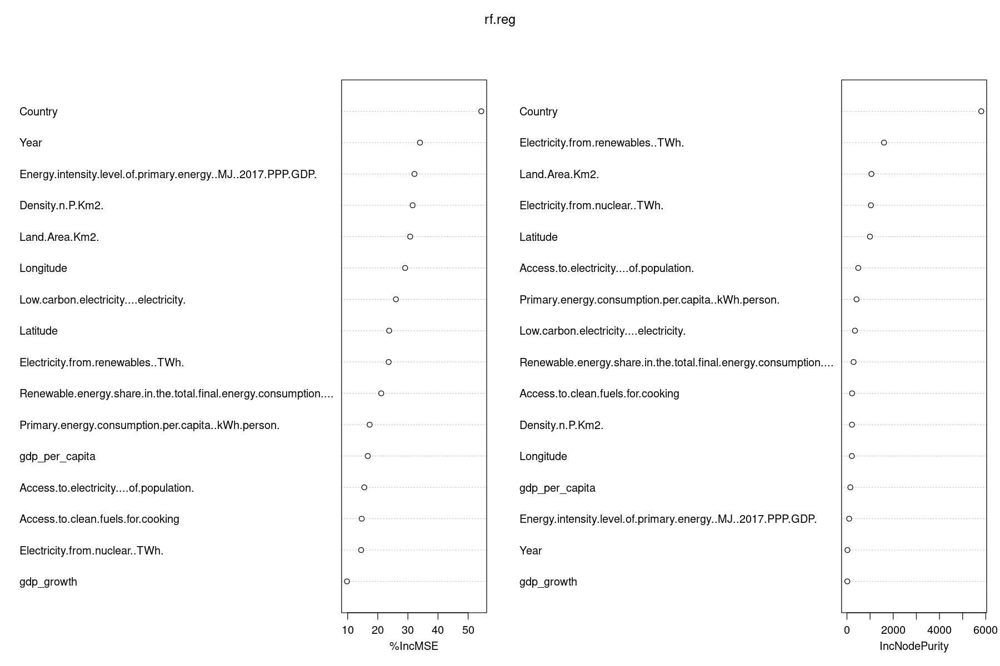

In [50]:
sort(round(importance(rf.reg), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg)

Le chargement a nécessité le package : randomForestSRC


 randomForestSRC 3.2.3 
 
 Type rfsrc.news() to see new features, changes, and bug fixes. 
 



Attachement du package : ‘randomForestSRC’


Les objets suivants sont masqués depuis ‘package:e1071’:

    impute, tune


L'objet suivant est masqué depuis ‘package:purrr’:

    partial




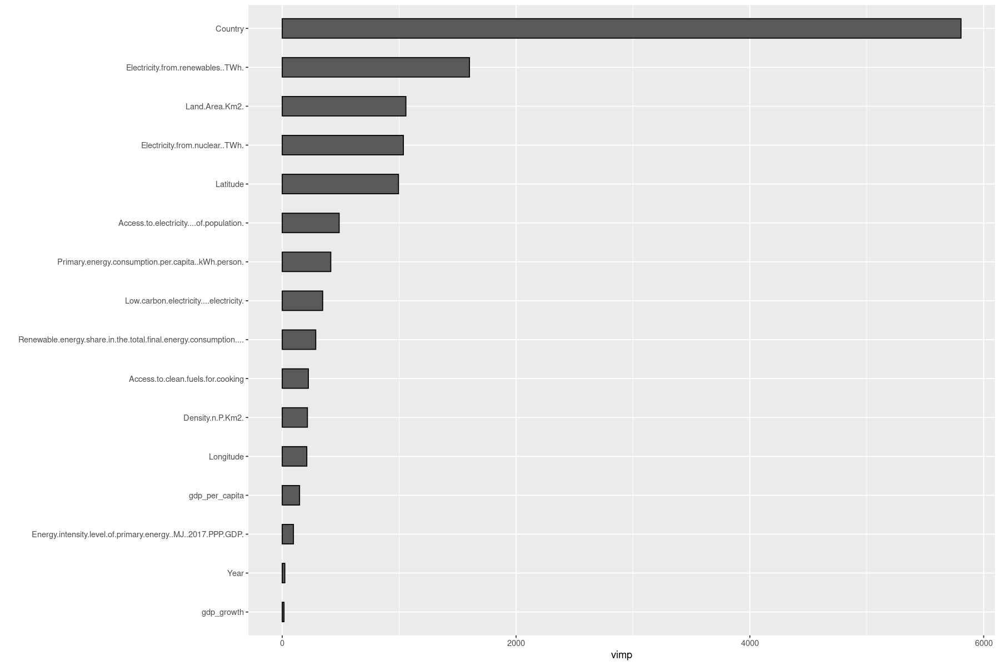

In [51]:
library(ggRandomForests)
plot(gg_vimp(rf.reg))

In [52]:
# Forêts aléatoires
pred.rfr=rf.reg$test$predicted
# Erreur quadratique moyenne de prévision
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.01434756

In [52]:
### conclusion : Random Forest mieux que toutes les méthodes précédemment implémentées, erreur : 0.014

In [53]:
install.packages("gbm")
library(gbm)

Installation du package dans ‘/home/apommier/R/libs’
(car ‘lib’ n'est pas spécifié)

Loaded gbm 2.1.9

This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3



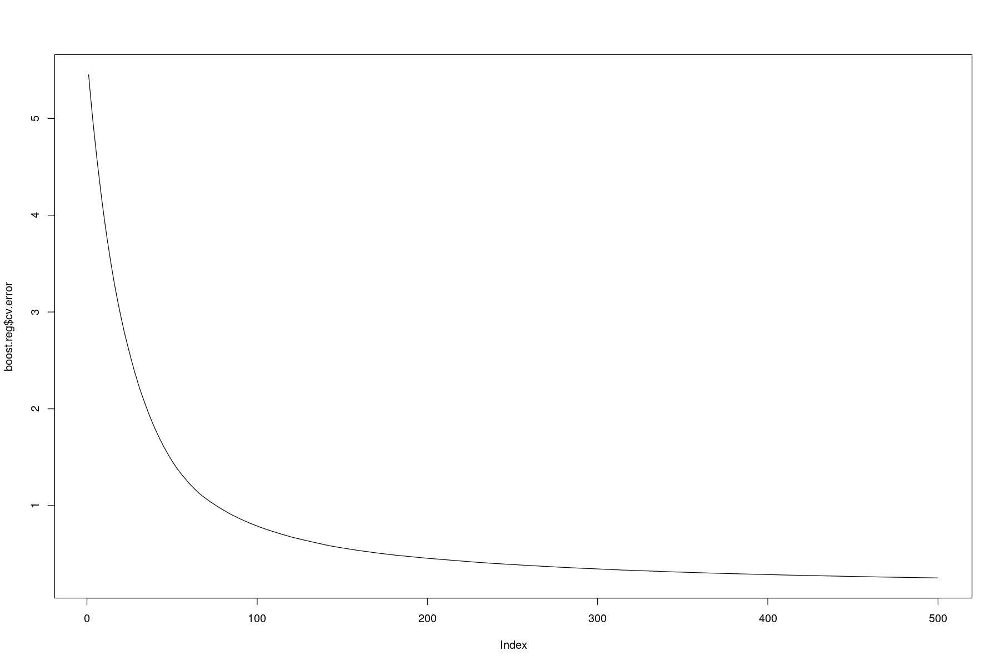

In [59]:
boost.reg = gbm(Value_co2_emissions_kt_by_country ~ ., data = datappr, distribution = "gaussian", n.trees = 500, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg$cv.error, type = "l")

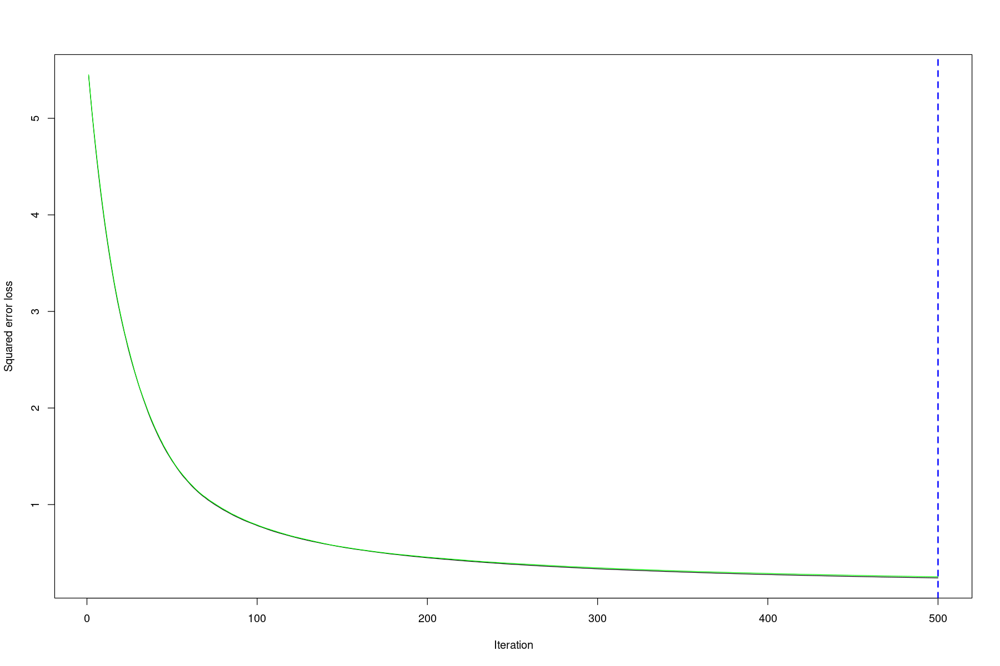

In [60]:
best.iter=gbm.perf(boost.reg,method="cv")

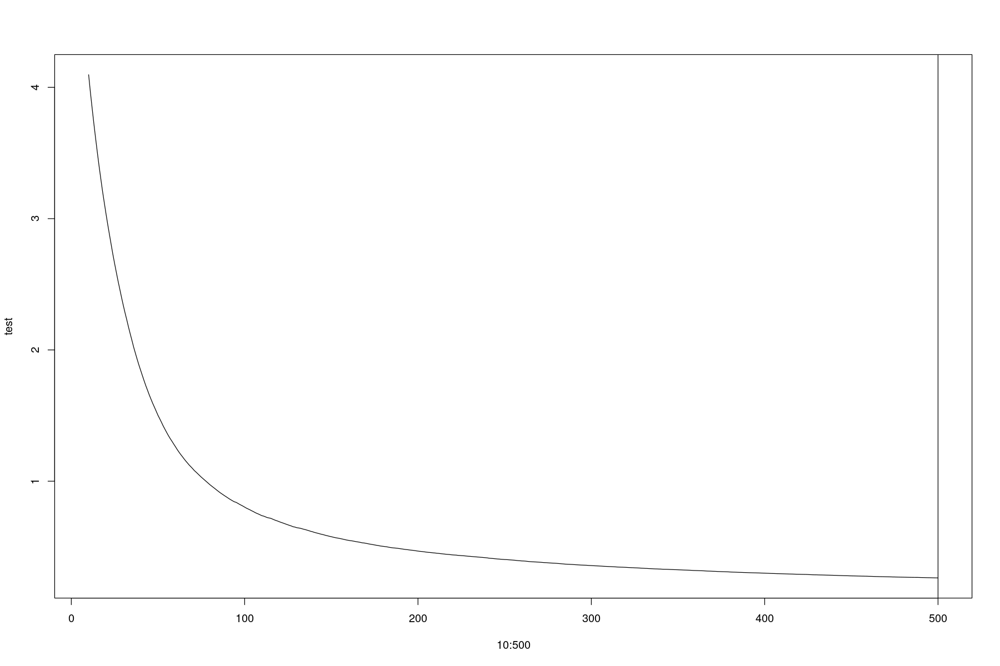

In [62]:
test=numeric()
for (i in 10:500){
pred.test=predict(boost.reg,newdata=datestr,n.trees=i)
err=sum((pred.test-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)
test=c(test,err)}
plot(10:500,test,type="l")
abline(v=best.iter)

Warning message:
“Removed 62 rows containing missing values (`geom_point()`).”


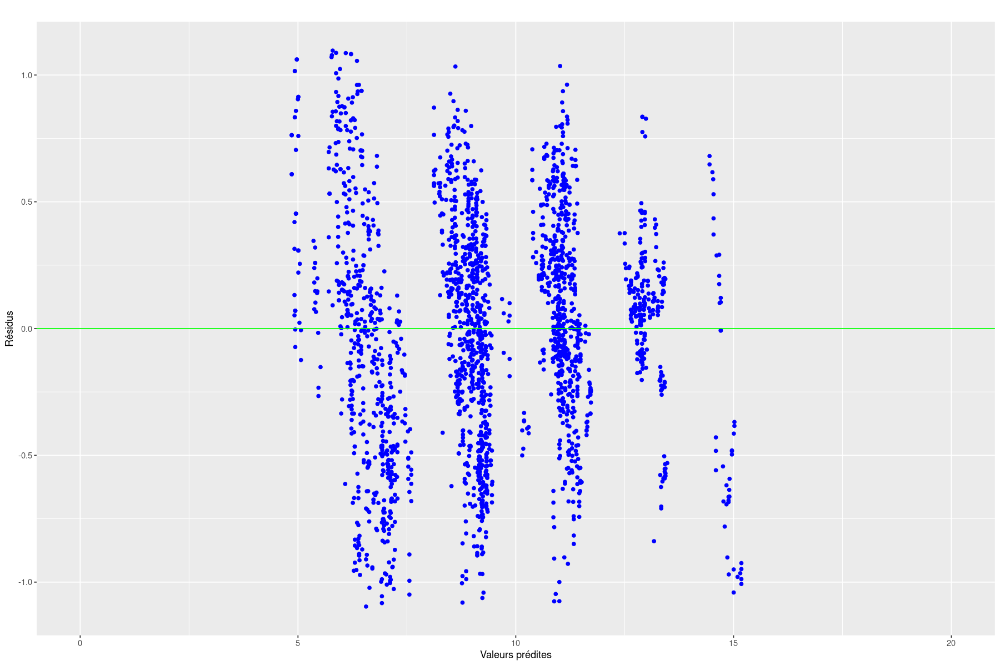

In [57]:
fit.boostr=boost.reg$fit
res.boostr=fit.boostr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.boostr,res.boostr,titre="")

In [58]:
pred.boostr=predict(boost.reg,newdata=datestr,n.trees=best.iter)
# Erreur quadratique moyenne de prévision
sum((pred.boostr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.2567708

In [25]:
## moins bien que random forest, à peu près mêmes performances que svm tuned radial

In [63]:
library(MASS)
library(nnet)
# apprentissage
# attention au paramètre linout dans le cas de la régression
nnet.reg=nnet(Value_co2_emissions_kt_by_country~.,data=datappr,size=10,decay=1,linout=TRUE,maxit=500) 
summary(nnet.reg)


Attachement du package : ‘MASS’


L'objet suivant est masqué depuis ‘package:plotly’:

    select


L'objet suivant est masqué depuis ‘package:dplyr’:

    select




# weights:  231
initial  value 247788.781634 
iter  10 value 10761.738112
iter  20 value 10168.085701
iter  30 value 9641.358196
iter  40 value 9303.310688
iter  50 value 8978.809850
iter  60 value 7595.670427
iter  70 value 6702.835594
iter  80 value 5585.986676
iter  90 value 5111.023296
iter 100 value 4185.814595
iter 110 value 3825.613136
iter 120 value 3390.349571
iter 130 value 2938.304905
iter 140 value 2535.641237
iter 150 value 2228.557765
iter 160 value 1907.865227
iter 170 value 1546.282185
iter 180 value 1352.550362
iter 190 value 1124.421660
iter 200 value 1014.355615
iter 210 value 957.894461
iter 220 value 886.662262
iter 230 value 782.551706
iter 240 value 704.321036
iter 250 value 649.757011
iter 260 value 610.169907
iter 270 value 543.628217
iter 280 value 503.618015
iter 290 value 460.540948
iter 300 value 429.123135
iter 310 value 394.952422
iter 320 value 352.479135
iter 330 value 332.171313
iter 340 value 309.300282
iter 350 value 291.786193
iter 360 value 278.712

a 21-10-1 network with 231 weights
options were - linear output units  decay=1
  b->h1  i1->h1  i2->h1  i3->h1  i4->h1  i5->h1  i6->h1  i7->h1  i8->h1  i9->h1 
  -0.15    0.15    0.04   -0.14   -0.21   -0.24   -0.10    0.15    0.84    0.26 
i10->h1 i11->h1 i12->h1 i13->h1 i14->h1 i15->h1 i16->h1 i17->h1 i18->h1 i19->h1 
  -0.02    0.05    0.01   -0.23    0.46   -0.35    0.24    0.09    0.10   -0.30 
i20->h1 i21->h1 
  -0.03    0.01 
  b->h2  i1->h2  i2->h2  i3->h2  i4->h2  i5->h2  i6->h2  i7->h2  i8->h2  i9->h2 
  -0.17   -0.01    0.15    0.57   -0.24    0.11   -0.26    0.47   -0.29    0.66 
i10->h2 i11->h2 i12->h2 i13->h2 i14->h2 i15->h2 i16->h2 i17->h2 i18->h2 i19->h2 
   0.02    0.48    0.04    0.03   -0.46   -0.15    0.13    0.16   -0.11   -0.21 
i20->h2 i21->h2 
  -0.12    0.05 
  b->h3  i1->h3  i2->h3  i3->h3  i4->h3  i5->h3  i6->h3  i7->h3  i8->h3  i9->h3 
  -0.43    0.05    0.43    0.53   -0.19    0.01   -0.27    0.23   -0.09   -0.49 
i10->h3 i11->h3 i12->h3 i13->h3 i14->h3 i15

In [ ]:
library(e1071)
neur.tune = tune.nnet(Value_co2_emissions_kt_by_country~.,data=datappr,size=c(8,9,10,11,12),decay=1:10,maxit=200,linout=TRUE)
plot(neur.tune)
neur.tune$best.parameters

# weights:  231
initial  value 237690.785815 
iter  10 value 11690.998704
iter  20 value 9919.959705
iter  30 value 8888.774351
iter  40 value 8217.287038
iter  50 value 7934.280087
iter  60 value 6871.952904
iter  70 value 6084.709423
iter  80 value 5646.740917
iter  90 value 4847.726422
iter 100 value 4397.668504
iter 110 value 4082.346895
iter 120 value 3706.652618
iter 130 value 2935.066300
iter 140 value 2055.316032
iter 150 value 1763.480982
iter 160 value 1461.964273
iter 170 value 1218.917542
iter 180 value 1035.686581
iter 190 value 935.729608
iter 200 value 827.421274
iter 210 value 763.328810
iter 220 value 710.598688
iter 230 value 675.184552
iter 240 value 652.999774
iter 250 value 641.235251
iter 260 value 628.824467
iter 270 value 613.924424
iter 280 value 600.509497
iter 290 value 591.019822
iter 300 value 582.849851
iter 310 value 571.028454
iter 320 value 560.150057
iter 330 value 553.106098
iter 340 value 541.665035
iter 350 value 537.609884
iter 360 value 533.674255

Warning message:
"Removed 5 rows containing missing values or values outside the scale range (`geom_point()`)."


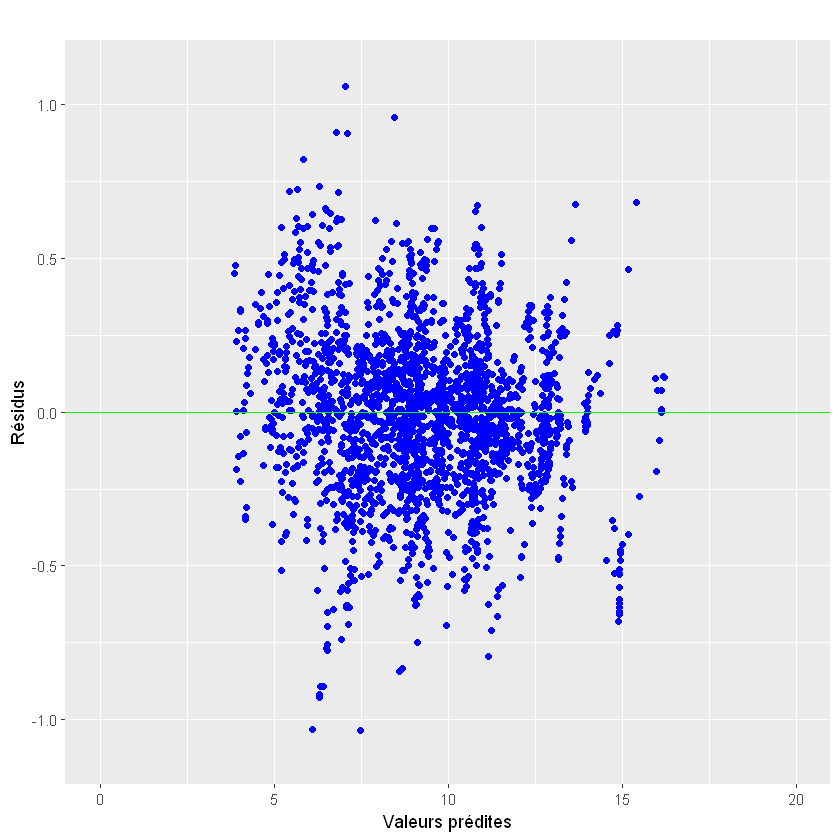

In [45]:
nnet.reg=nnet(Value_co2_emissions_kt_by_country~.,data=datappr,size=10,decay=4,linout=TRUE,maxit=500)
# calcul et graphe des résidus
fit.nnetr=predict(nnet.reg,data=datappr)
res.nnetr=fit.nnetr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.nnetr,res.nnetr,titre="")

In [46]:
# Calcul des prévisions
pred.nnetr=predict(nnet.reg,newdata=datestr)
# Erreur quadratique moyenne de prévision
sum((pred.nnetr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.09264641

In [ ]:
### complétion des données manquantes grâce à l'algo missforest

In [ ]:
# Lecture des données
energy <- read.table("energy.txt", sep = ",", header = TRUE)
# Premières lignes du jeu de données
head(energy)
# Vérification du contenu
summary(energy)
dim(energy)

In [4]:
# Conversion de la variable Year en facteur
energy$Year <- as.factor(energy$Year)
# Conversion de la variable Density en variable numérique
energy$Density.n.P.Km2. <- as.numeric(gsub(",", "", energy$Density.n.P.Km2.))

In [5]:
energy[, "Access.to.electricity....of.population."] <- sqrt(energy[, "Access.to.electricity....of.population."])
energy[, "Access.to.clean.fuels.for.cooking"] <- sqrt(energy[, "Access.to.clean.fuels.for.cooking"])
energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."] <- sqrt(energy[, "Renewable.energy.share.in.the.total.final.energy.consumption...."])
energy[, "Electricity.from.fossil.fuels..TWh."] <- sqrt(energy[, "Electricity.from.fossil.fuels..TWh."])
energy[, "Electricity.from.nuclear..TWh."] <- sqrt(energy[, "Electricity.from.nuclear..TWh."])
energy[, "Electricity.from.renewables..TWh."] <- sqrt(energy[, "Electricity.from.renewables..TWh."])
energy[, "Low.carbon.electricity....electricity."] <- sqrt(energy[, "Low.carbon.electricity....electricity."])
energy[, "Primary.energy.consumption.per.capita..kWh.person."] <- sqrt(energy[, "Primary.energy.consumption.per.capita..kWh.person."])
energy[, "Value_co2_emissions_kt_by_country"] <- log(energy[, "Value_co2_emissions_kt_by_country"])
energy[, "gdp_per_capita"] <- log(energy[, "gdp_per_capita"])
energy[, "Density.n.P.Km2."] <- log(energy[, "Density.n.P.Km2."])
energy[, "Land.Area.Km2."] <- log(energy[, "Land.Area.Km2."])

In [6]:
library(forcats)
energy$Entity <- as.factor(energy$Entity)
df <- energy$Value_co2_emissions_kt_by_country
df <-  matrix(df, nrow = 3649)
df <- as.data.frame(df)
colnames(df) = list("CO2")
df$Entity <- energy$Entity
df_mean <- summarise(group_by(df, Entity), mean_value = mean(CO2, na.rm = TRUE))
CO2 <- df_mean$mean_value
Entity <- df_mean$Entity
df <- data.frame(Entity = Entity, CO2 = CO2)
fr <- df[48,] ## France
df <- arrange(df, desc(CO2))
intervals <- c(0, 8, 10, 12, 14, 16)
labels <- c("--", "-", "=", "+", "++")
df$u <- cut(df$CO2, breaks = intervals, labels = labels, include.lowest = TRUE)
# Créer un dataframe avec les correspondances entre les pays et les modalités
modalites <- data.frame(Entity = df$Entity, Country = df$u)
# Joindre les deux dataframes en fonction du nom du pays
energy <- merge(energy, modalites, by = "Entity", all.x = TRUE)
# Afficher les premières lignes du dataframe pour vérifier
energy <- subset(energy, select = -Entity)
energy$Year <- fct_collapse(energy$Year, "2000-2004" = c("2000","2001","2002","2003","2004"), "2005-2009" = c("2005","2006","2007","2008","2009"),
                            "2010-2014" = c("2010","2011","2012","2013","2014"), "2015-2020" = c("2015","2016","2017","2018","2019","2020"))
summary(energy)

        Year      Access.to.electricity....of.population.
 2000-2004: 861   Min.   : 1.119                         
 2005-2009: 866   1st Qu.: 7.733                         
 2010-2014: 872   Median : 9.918                         
 2015-2020:1050   Mean   : 8.619                         
                  3rd Qu.:10.000                         
                  Max.   :10.000                         
                  NA's   :10                             
 Access.to.clean.fuels.for.cooking
 Min.   : 0.000                   
 1st Qu.: 4.814                   
 Median : 9.119                   
 Mean   : 7.244                   
 3rd Qu.:10.000                   
 Max.   :10.000                   
 NA's   :169                      
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   3.54                                     
 Median :  32.91                                     
 Mean   : 113.14                        

In [7]:
missing_data <- colMeans(is.na(energy)) * 100

# Trier les résultats par ordre décroissant
sorted_missing_data <- sort(missing_data, decreasing = TRUE)

# Afficher les résultats de manière propre
cat("Pourcentage de données manquantes par variable (ordre décroissant):\n")
for (i in seq_along(sorted_missing_data)) {
  cat(names(sorted_missing_data)[i], ": ", sprintf("%.2f", sorted_missing_data[i]), "%\n")
}
head(energy)

Pourcentage de données manquantes par variable (ordre décroissant):
Renewables....equivalent.primary.energy. :  58.56 %
Financial.flows.to.developing.countries..US... :  57.25 %
Renewable.electricity.generating.capacity.per.capita :  25.51 %
Value_co2_emissions_kt_by_country :  11.73 %
gdp_growth :  8.69 %
gdp_per_capita :  7.73 %
Country :  6.93 %
Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. :  5.67 %
Renewable.energy.share.in.the.total.final.energy.consumption.... :  5.32 %
Access.to.clean.fuels.for.cooking :  4.63 %
Electricity.from.nuclear..TWh. :  3.45 %
Low.carbon.electricity....electricity. :  1.15 %
Electricity.from.fossil.fuels..TWh. :  0.58 %
Electricity.from.renewables..TWh. :  0.58 %
Access.to.electricity....of.population. :  0.27 %
Density.n.P.Km2. :  0.03 %
Land.Area.Km2. :  0.03 %
Latitude :  0.03 %
Longitude :  0.03 %
Year :  0.00 %
Primary.energy.consumption.per.capita..kWh.person. :  0.00 %


,Year,Access.to.electricity....of.population.,Access.to.clean.fuels.for.cooking,Renewable.electricity.generating.capacity.per.capita,Financial.flows.to.developing.countries..US...,Renewable.energy.share.in.the.total.final.energy.consumption....,Electricity.from.fossil.fuels..TWh.,Electricity.from.nuclear..TWh.,Electricity.from.renewables..TWh.,Low.carbon.electricity....electricity.,⋯,Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP.,Value_co2_emissions_kt_by_country,Renewables....equivalent.primary.energy.,gdp_growth,gdp_per_capita,Density.n.P.Km2.,Land.Area.Km2.,Latitude,Longitude,Country
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,2000-2004,1.270272,2.489980,9.22,20000,6.707459,0.4000000,0,0.5567764,8.121419,⋯,1.64,6.633318,NA,NA,NA,4.094345,13.38815,33.93911,67.70995,-
2,2000-2004,2.018557,2.683282,8.86,130000,6.752777,0.3000000,0,0.7071068,9.205746,⋯,1.74,6.593045,NA,NA,NA,4.094345,13.38815,33.93911,67.70995,-
3,2000-2004,3.067435,2.863564,8.47,3950000,6.150610,0.3605551,0,0.7483315,9.008853,⋯,1.40,6.937314,NA,NA,5.189766,4.094345,13.38815,33.93911,67.70995,-
4,2000-2004,3.839076,3.082207,8.09,25970000,6.054750,0.5567764,0,0.7937254,8.186653,⋯,1.40,7.106606,NA,8.832278,5.250617,4.094345,13.38815,33.93911,67.70995,-
5,2000-2004,4.479394,3.301515,7.75,NA,6.651316,0.5744563,0,0.7483315,7.932298,⋯,1.20,6.937314,NA,1.414118,5.353667,4.094345,13.38815,33.93911,67.70995,-
6,2005-2009,5.038938,3.492850,7.51,9830000,5.820653,0.5830952,0,0.7681146,7.964977,⋯,1.41,7.346010,NA,11.229715,5.489067,4.094345,13.38815,33.93911,67.70995,-


Le chargement a nécessité le package : colorspace


Attachement du package : ‘colorspace’


L'objet suivant est masqué depuis ‘package:pROC’:

    coords


Le chargement a nécessité le package : grid

VIM is ready to use.


Suggestions and bug-reports can be submitted at: https://github.com/statistikat/VIM/issues


Attachement du package : ‘VIM’


L'objet suivant est masqué depuis ‘package:datasets’:

    sleep





 Variables sorted by number of missings: 
                                                         Variable        Count
                         Renewables....equivalent.primary.energy. 0.5856399013
                   Financial.flows.to.developing.countries..US... 0.5724856125
             Renewable.electricity.generating.capacity.per.capita 0.2551383941
                                Value_co2_emissions_kt_by_country 0.1172924089
                                                       gdp_growth 0.0868731159
                                                   gdp_per_capita 0.0772814470
                                                          Country 0.0693340641
      Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 0.0567278706
 Renewable.energy.share.in.the.total.final.energy.consumption.... 0.0531652508
                                Access.to.clean.fuels.for.cooking 0.0463140586
                                   Electricity.from.nuclear..TWh. 0.0345300082
         

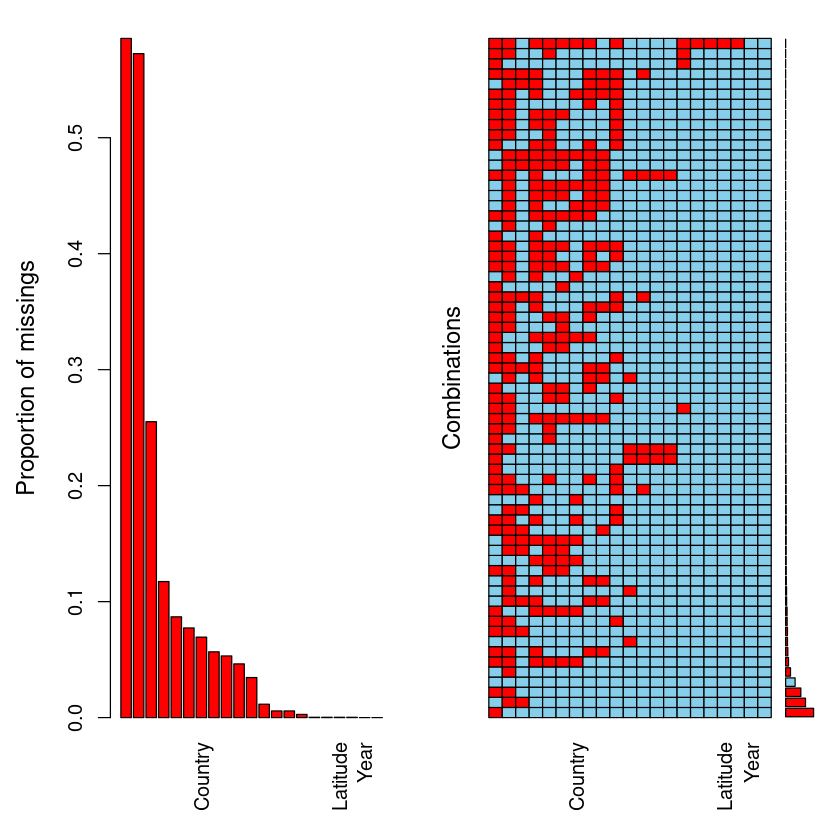

In [8]:
library(VIM)
res<-summary(aggr(energy, sortVar=TRUE))$combinations

In [9]:
library(missForest)


Attachement du package : ‘missForest’


L'objet suivant est masqué depuis ‘package:VIM’:

    nrmse




In [10]:
energyImp=missForest(energy)

In [11]:
energyImp <- energyImp$ximp
class(energyImp)
summary(energyImp)
str(energyImp)

[1] "data.frame"

        Year      Access.to.electricity....of.population.
 2000-2004: 861   Min.   : 1.119                         
 2005-2009: 866   1st Qu.: 7.690                         
 2010-2014: 872   Median : 9.913                         
 2015-2020:1050   Mean   : 8.604                         
                  3rd Qu.:10.000                         
                  Max.   :10.000                         
 Access.to.clean.fuels.for.cooking
 Min.   : 0.000                   
 1st Qu.: 5.089                   
 Median : 9.214                   
 Mean   : 7.350                   
 3rd Qu.:10.000                   
 Max.   :10.000                   
 Renewable.electricity.generating.capacity.per.capita
 Min.   :   0.00                                     
 1st Qu.:   8.39                                     
 Median :  63.87                                     
 Mean   : 183.17                                     
 3rd Qu.: 267.87                                     
 Max.   :3060.19         

'data.frame':	3649 obs. of  21 variables:
 $ Year                                                            : Factor w/ 4 levels "2000-2004","2005-2009",..: 1 1 1 1 1 2 2 2 2 2 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 3.84 4.48 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.08 3.3 ...
 $ Renewable.electricity.generating.capacity.per.capita            : num  9.22 8.86 8.47 8.09 7.75 7.51 7.4 7.25 7.49 7.5 ...
 $ Financial.flows.to.developing.countries..US...                  : num  20000 130000 3950000 25970000 18228900 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.05 6.65 ...
 $ Electricity.from.fossil.fuels..TWh.                             : num  0.4 0.3 0.361 0.557 0.574 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                             

In [12]:
set.seed(111) # initialisation du générateur
# Extraction des échantillons
test.ratio <- .2   # part de l'échantillon test
npop <- nrow(energyImp) # nombre de lignes
nvar <- ncol(energyImp) # nombre de colonnes
# taille de l'échantillon test
ntest <- ceiling(npop * test.ratio) 
# indices de l'échantillon test
testi <- sample(1:npop, ntest)
# indices de l'échantillon d'apprentissage
appri <- setdiff(1:npop, testi) 
### pour CO2 emissions
datappr <- energyImp[appri, -c(7)] 
# construction de l'échantillon test
datestr <- energyImp[testi, -c(7)] 
# vérification
str(datappr)
str(datestr)

'data.frame':	2919 obs. of  20 variables:
 $ Year                                                            : Factor w/ 4 levels "2000-2004","2005-2009",..: 1 1 1 1 2 2 2 2 3 3 ...
 $ Access.to.electricity....of.population.                         : num  1.27 2.02 3.07 4.48 5.04 ...
 $ Access.to.clean.fuels.for.cooking                               : num  2.49 2.68 2.86 3.3 3.49 ...
 $ Renewable.electricity.generating.capacity.per.capita            : num  9.22 8.86 8.47 7.75 7.51 7.4 7.25 7.49 8.27 8.13 ...
 $ Financial.flows.to.developing.countries..US...                  : num  20000 130000 3950000 18228900 9830000 ...
 $ Renewable.energy.share.in.the.total.final.energy.consumption....: num  6.71 6.75 6.15 6.65 5.82 ...
 $ Electricity.from.nuclear..TWh.                                  : num  0 0 0 0 0 0 0 0 0 0 ...
 $ Electricity.from.renewables..TWh.                               : num  0.557 0.707 0.748 0.748 0.768 ...
 $ Low.carbon.electricity....electricity.                    

In [13]:
gplot.res <- function(x, y, titre = "titre"){
    ggplot(data.frame(x=x, y=y),aes(x,y))+
    geom_point(col = "blue")+xlim(0, 20)+ylim(-1.1, 1.1)+
    ylab("Résidus")+ xlab("Valeurs prédites")+
    ggtitle(titre)+
    geom_hline(yintercept = 0,col="green")
}

In [14]:
library(e1071)

In [15]:
svm.reg.poly.tune <- tune.svm(Value_co2_emissions_kt_by_country ~ . - Country - Year, type = "eps-regression", data = datappr, kernel = "poly", cost = c(1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5), coef0 = -5:5, gamma = seq(0.02, 0.1, by = 0.02))
summary(svm.reg.poly.tune)


Parameter tuning of ‘svm’:

- sampling method: 10-fold cross validation 

- best parameters:
 gamma coef0 cost
  0.04     5    3

- best performance: 0.03832001 

- Detailed performance results:
    gamma coef0 cost        error   dispersion
1    0.02    -5  1.0 2.129996e+05 3.926332e+04
2    0.04    -5  1.0 3.342936e+06 5.571769e+05
3    0.06    -5  1.0 2.253488e+07 1.238262e+07
4    0.08    -5  1.0 6.040102e+07 1.145786e+07
5    0.10    -5  1.0 1.532877e+08 2.992280e+07
6    0.02    -4  1.0 1.625173e+05 8.605268e+04
7    0.04    -4  1.0 2.620796e+06 1.464703e+06
8    0.06    -4  1.0 1.448654e+07 8.721145e+06
9    0.08    -4  1.0 4.021899e+07 7.792393e+06
10   0.10    -4  1.0 1.023312e+08 1.960504e+07
11   0.02    -3  1.0 7.484060e+04 1.272994e+04
12   0.04    -3  1.0 1.553504e+06 9.434141e+05
13   0.06    -3  1.0 7.111074e+06 1.398886e+06
14   0.08    -3  1.0 2.376561e+07 4.527901e+06
15   0.10    -3  1.0 7.003838e+07 3.854508e+07
16   0.02    -2  1.0 4.142977e+04 2.141078e+04
17   

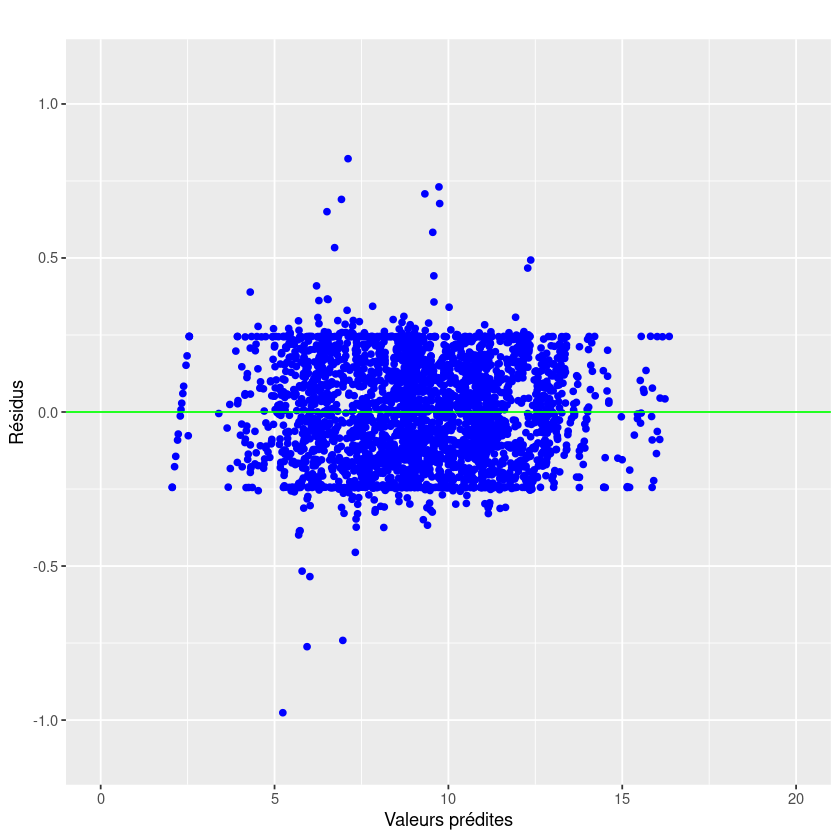

In [16]:
fit.svmr=svm.reg.poly.tune$best.model$fitted
res.svmr=fit.svmr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.svmr,res.svmr,titre="")

In [17]:
pred.svmr.poly.tune = predict(svm.reg.poly.tune$best.model, newdata = datestr)
paste("Tuned polynomial kernel:",sum((pred.svmr.poly.tune-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr),sep=" ")

[1] "Tuned polynomial kernel: 0.0464030460556976"

In [18]:
library(randomForest)

randomForest 4.7-1.1

Type rfNews() to see new features/changes/bug fixes.


Attachement du package : ‘randomForest’


L'objet suivant est masqué depuis ‘package:gridExtra’:

    combine


L'objet suivant est masqué depuis ‘package:dplyr’:

    combine


L'objet suivant est masqué depuis ‘package:ggplot2’:

    margin




In [19]:
rf.reg=randomForest(Value_co2_emissions_kt_by_country~., data=datappr,xtest=datestr[,-10],ytest=datestr[,"Value_co2_emissions_kt_by_country"],
   ntree=500,do.trace=50,importance=TRUE)
attributes(rf.reg)
rf.reg$mtry

     |      Out-of-bag   |       Test set    |
Tree |      MSE  %Var(y) |      MSE  %Var(y) |
  50 |  0.01616     0.27 |   0.1577     2.65 |
 100 |  0.01454     0.24 |   0.1348     2.26 |
 150 |  0.01399     0.23 |     0.14     2.35 |
 200 |  0.01357     0.23 |   0.1436     2.41 |
 250 |  0.01324     0.22 |   0.1423     2.39 |
 300 |  0.01305     0.22 |   0.1313     2.20 |
 350 |  0.01297     0.22 |   0.1327     2.23 |
 400 |   0.0129     0.22 |   0.1398     2.34 |
 450 |  0.01289     0.22 |    0.138     2.31 |
 500 |  0.01295     0.22 |   0.1415     2.37 |


$names
 [1] "call"            "type"            "predicted"       "mse"            
 [5] "rsq"             "oob.times"       "importance"      "importanceSD"   
 [9] "localImportance" "proximity"       "ntree"           "mtry"           
[13] "forest"          "coefs"           "y"               "test"           
[17] "inbag"           "terms"          

$class
[1] "randomForest.formula" "randomForest"

[1] 6

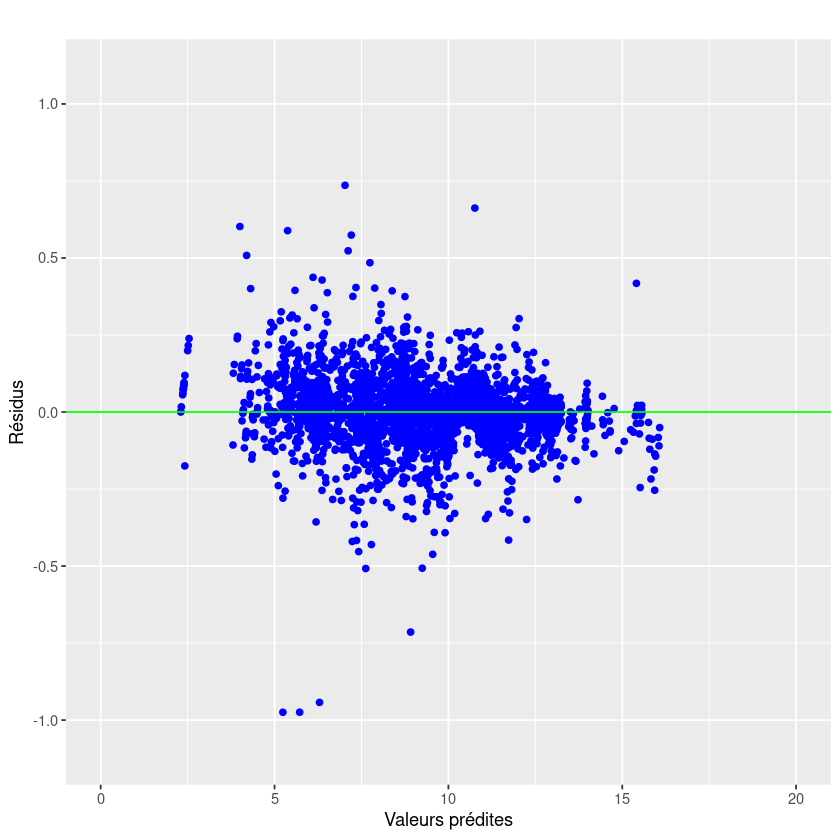

In [21]:
fit.rfr=rf.reg$predicted
res.rfr=fit.rfr-datappr[,"Value_co2_emissions_kt_by_country"]
gplot.res(fit.rfr,res.rfr,titre="")

Country 
                                                           40.91 
                                                Density.n.P.Km2. 
                                                           31.77 
                                                            Year 
                                                           31.34 
     Energy.intensity.level.of.primary.energy..MJ..2017.PPP.GDP. 
                                                           30.51 
                                                       Longitude 
                                                           30.45 
                                                  Land.Area.Km2. 
                                                           27.62 
                        Renewables....equivalent.primary.energy. 
                                                           25.94 
                               Electricity.from.renewables..TWh. 
                                                           25.55 
                                                        Latitude 
                                                           23.93 
                                                  gdp_per_capita 
                                                           22.63 
              Primary.energy.consumption.per.capita..kWh.person. 
                                                           19.57 
                          Low.carbon.electricity....electricity. 
                                                           19.06 
                               Access.to.clean.fuels.for.cooking 
                                                           17.33 
                                  Electricity.from.nuclear..TWh. 
                                                           16.34 
                  Financial.flows.to.developing.countries..US... 
                                                           15.76 
Renewable.energy.share.in.the.total.final.energy.consumption.... 
                                                           15.75 
            Renewable.electricity.generating.capacity.per.capita 
                                                           14.66 
                         Access.to.electricity....of.population. 
                                                           11.66 
                                                      gdp_growth 
                                                            5.99

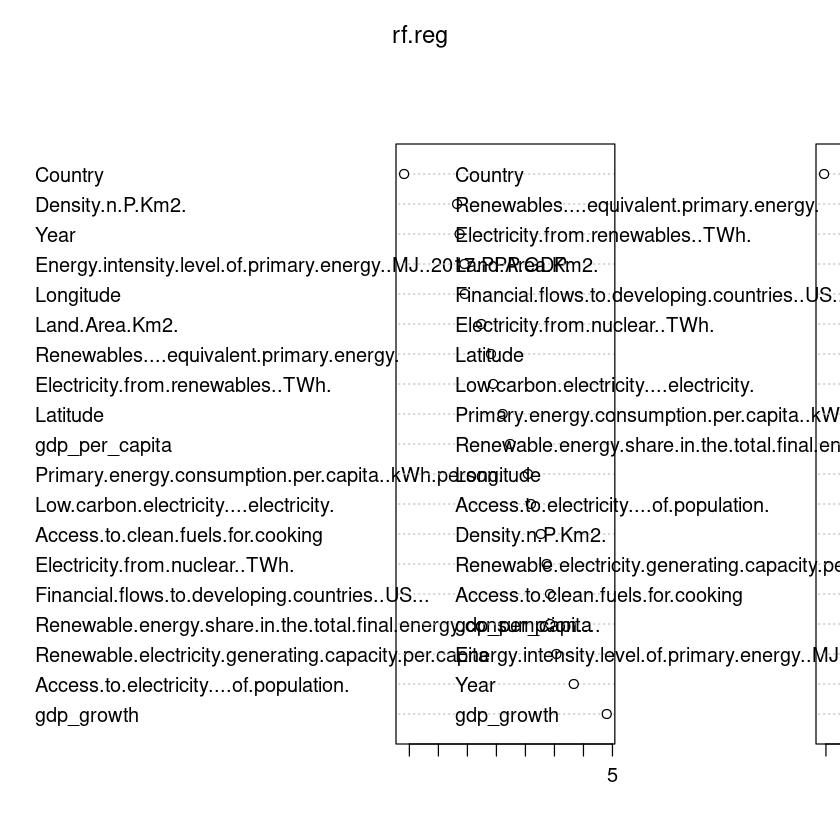

In [22]:
sort(round(importance(rf.reg), 2)[,1], decreasing=TRUE)
varImpPlot(rf.reg)

Le chargement a nécessité le package : randomForestSRC


 randomForestSRC 3.2.3 
 
 Type rfsrc.news() to see new features, changes, and bug fixes. 
 



Attachement du package : ‘randomForestSRC’


Les objets suivants sont masqués depuis ‘package:e1071’:

    impute, tune


L'objet suivant est masqué depuis ‘package:purrr’:

    partial




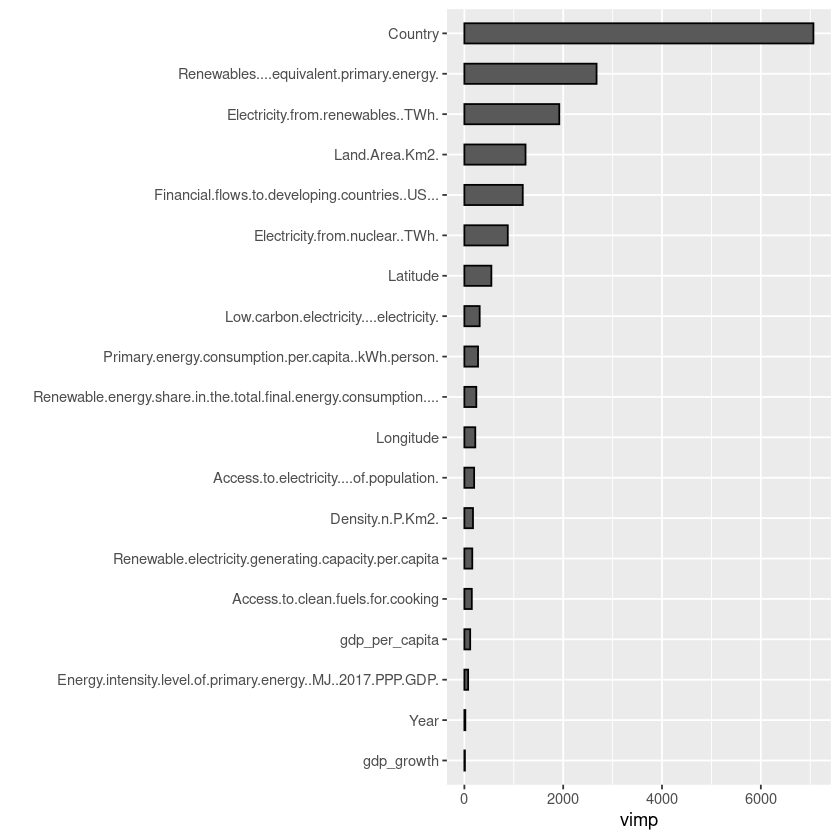

In [23]:
library(ggRandomForests)
plot(gg_vimp(rf.reg))

In [24]:
# Forêts aléatoires
pred.rfr=rf.reg$test$predicted
# Erreur quadratique moyenne de prévision
sum((pred.rfr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.1414743

In [26]:
install.packages("gbm")
library(gbm)

Installation du package dans ‘/home/apommier/R/libs’
(car ‘lib’ n'est pas spécifié)

Loaded gbm 2.1.9

This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3



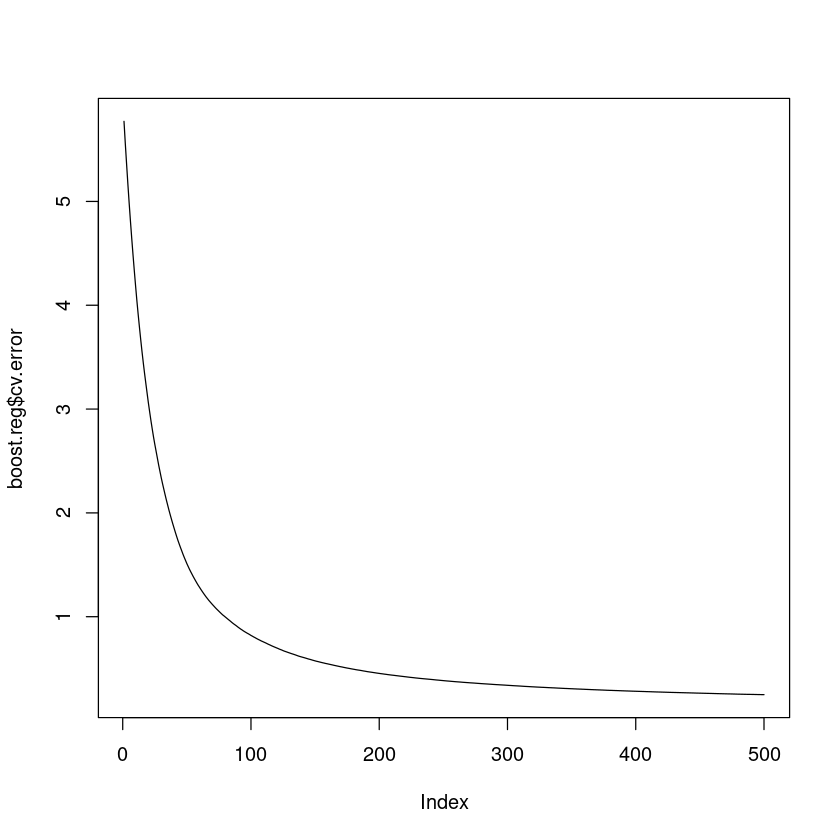

In [27]:
boost.reg = gbm(Value_co2_emissions_kt_by_country ~ ., data = datappr, distribution = "gaussian", n.trees = 500, 
    cv.folds = 10, n.minobsinnode = 5, shrinkage = 0.03, verbose = FALSE)
# fixer verbose à FALSE pour éviter trop de sorties
plot(boost.reg$cv.error, type = "l")

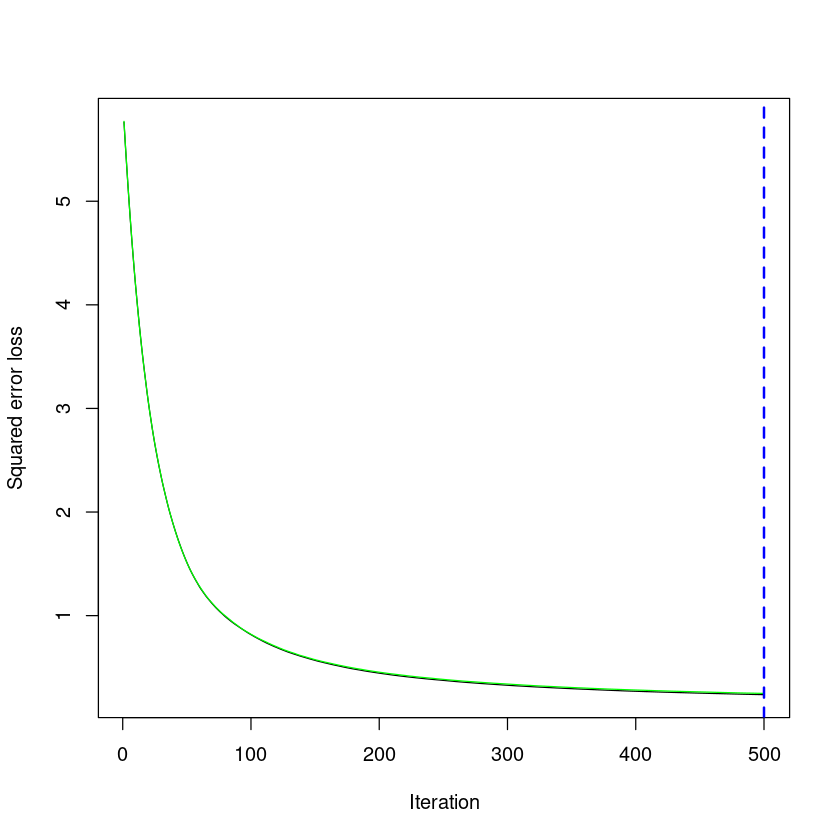

In [29]:
best.iter=gbm.perf(boost.reg,method="cv")

In [30]:
pred.boostr=predict(boost.reg,newdata=datestr,n.trees=best.iter)
# Erreur quadratique moyenne de prévision
sum((pred.boostr-datestr[,"Value_co2_emissions_kt_by_country"])^2)/nrow(datestr)

[1] 0.2536185